# Conditional DCGAN - MNIST

In this notebook, we will create a Condition GAN using the MNIST dataset following the implementation of the paper a Deep Convolutional GAN (DCGAN) https://arxiv.org/pdf/1511.06434v1.pdf, a very successful and influential GAN model developed in 2015 and from the paper Conditional Generative Adversarial Nets (Mirza and Osindero, 2014) https://arxiv.org/abs/1411.1784 .

The common GAN model is composed of two sub-models: a generator (G) which generates examples from noise vectors (z) and a discriminator (D) which classify whether generated examples are real or fake. The generator and the discriminator are trained jointly, where the generator try to fool the discriminator. Mathematically, that means for the generator $D(G(z))$ should be close to 1 if the generator succeed to fool the discriminator. On the contrary, for the discriminator, $D(G(z))$ should be  close to 0, and $D(G(x))$ should be close to 1 (real image). So, we can see that the generator and the discriminator are competing and they are playing a minmax game :

$\min _{G} \max _{D} V(D, G)=\mathbb{E}_{x \sim p_{\text {data }}(x)}[\log D(x)]+\mathbb{E}_{z \sim p_{z}(z)}[\log (1-D(G(z)))]$

The Architecture guidelines for stable Deep Convolutional GANs : 
- Replace any pooling layers with strided convolutions (discriminator) and fractional-stridedconvolutions (generator)
- Use batchnorm in both the generator and the discriminator.
- Remove fully connected hidden layers for deeper architectures.
- Use ReLU activation in generator for all layers except for the output, which uses Tanh.
- Use LeakyReLU activation in the discriminator for all layers.

The code of the models into "models/DCGAN.py"


![image](imgs/dcgan_generator.png)

The Conditional GAN is a GAN where we can choose which class we want to generate. For instance, in this notebook, we will be able to generate digit from 0 to 9. To do that, we need first a labelised dataset (MNIST) with $N$ classes. Then, we need to do two modifications from our previous experiment, one for the generator and one for the discriminator :
- concatenate the noise vector with a one hot vector which indicates which class we want to generate 
- concatenate the image generated with an image of N channels which follow the same pattern than the one hot vector. It is used to indicate to the discriminator which classes the image generated is associated with.

![image](imgs/ConditionalGAN.JPG)

In [1]:
import torch
from torch import nn
from torch.nn import functional as F
from tqdm import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from DCGAN import DCGAN_Generator, DCGAN_Discriminator
import random
import numpy as np
import os

In [2]:
def generate_noise_vector(n_samples, z_dim, device):
    return torch.randn(n_samples, z_dim, device=device)

In [3]:
SEED = 42

def seed_everything(seed_value):
    random.seed(seed_value)
    np.random.seed(seed_value)
    torch.manual_seed(seed_value)
    os.environ['PYTHONHASHSEED'] = str(seed_value)
    
    if torch.cuda.is_available(): 
        torch.cuda.manual_seed(seed_value)
        torch.cuda.manual_seed_all(seed_value)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False
seed_everything(SEED)

In [4]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5) # take only num_image from the batch
    plt.imshow(image_grid.permute(1, 2, 0).squeeze()) # to put the right order regarding the dimension
    plt.show()

In [5]:
def noise_vector_cond(noise_vectors, labels, n_class):
    """
        return the noise vectors with the one hot labeled concatenated.
        Input of the conditional generator
    """
    
    one_hots = F.one_hot(labels, n_class ).to(noise_vectors.device)
    return torch.cat((noise_vectors, one_hots), dim=-1)

def image_cond(images, labels, n_class):
    """
        return the noise vectors with the one hot labeled concatenated.
        Input of the conditional generator
    """
    
    one_hots = F.one_hot(labels, n_class).to(images.device).unsqueeze(-1).unsqueeze(-1)
    one_hots = one_hots * torch.ones(images.shape, device=images.device)
    return torch.cat((images, one_hots), dim=1)

## Training Parameters
  *   criterion: the loss function => BCEWithLogitsLoss
  *   n_epochs: the number of times you iterate through the mnist dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type
  *   gen_optimizer, disc_optimizer : optimizer used to correct the generator and discriminator => Adam
  
  
We need during the training to detach the fake image generated when we do a forward with the discriminator !

In [6]:
z_dim = 64
n_classes = 10

z_dim_cond = z_dim + n_classes

im_chan_gen = 1
im_chan_disc = im_chan_gen + n_classes

lr = 0.0002
device = 'cuda'
gen = DCGAN_Generator(z_dim=z_dim_cond, im_chan=im_chan_gen, hidden_dim=32, kernel_sizes=[3, 4, 3, 4 ], strides=[2, 1, 2, 2]).to(device)
gen_optimizer = torch.optim.Adam(gen.parameters(), lr=lr )

disc = DCGAN_Discriminator(input_chan=im_chan_disc, hidden_dim=32, kernel_sizes=[4,4,4], strides=[2,2,2]).to(device)
disc_optimizer = torch.optim.Adam(disc.parameters(), lr=lr )


In [7]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
display_step = 500
batch_size = 128




transform = transforms.Compose([
    transforms.ToTensor(),])

dataloader = DataLoader(
    MNIST('.', download=True, transform=transform),
    batch_size=batch_size,
    shuffle=True)

Loss Generator: 1.273 / Loss Discriminator 0.4604: 100%|██████████| 469/469 [00:15<00:00, 29.37it/s]
Loss Generator: 2.2083 / Loss Discriminator 0.1924:   6%|▌         | 28/469 [00:00<00:13, 31.96it/s]

Epochs : 1 , steps : 500


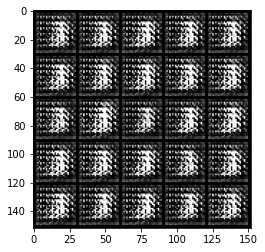

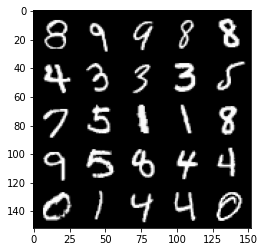

Loss Generator: 2.3505 / Loss Discriminator 0.1787: 100%|██████████| 469/469 [00:15<00:00, 30.06it/s]
Loss Generator: 2.3109 / Loss Discriminator 0.1896:  13%|█▎        | 61/469 [00:02<00:13, 30.94it/s]

Epochs : 2 , steps : 1000


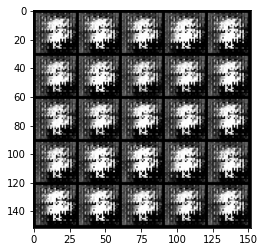

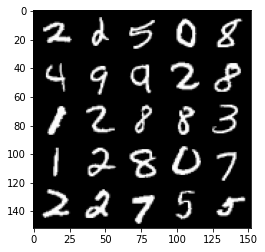

Loss Generator: 2.6871 / Loss Discriminator 0.1574: 100%|██████████| 469/469 [00:15<00:00, 29.47it/s]
Loss Generator: 3.267 / Loss Discriminator 0.0853:  19%|█▉        | 90/469 [00:03<00:12, 31.51it/s]

Epochs : 3 , steps : 1500


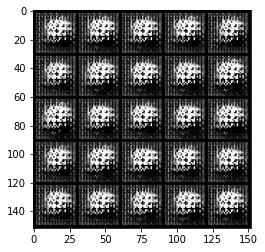

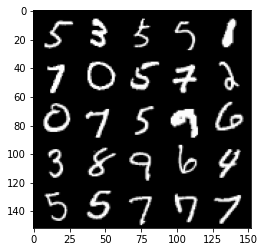

Loss Generator: 3.2674 / Loss Discriminator 0.0841: 100%|██████████| 469/469 [00:16<00:00, 29.08it/s]
Loss Generator: 3.5895 / Loss Discriminator 0.0957:  26%|██▌       | 121/469 [00:04<00:11, 29.51it/s]

Epochs : 4 , steps : 2000


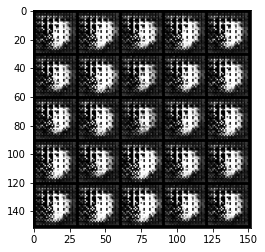

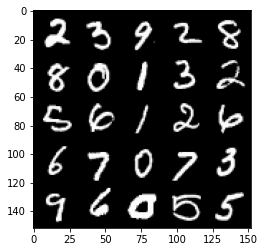

Loss Generator: 3.9244 / Loss Discriminator 0.0539: 100%|██████████| 469/469 [00:15<00:00, 29.41it/s]
Loss Generator: 3.9777 / Loss Discriminator 0.0559:  32%|███▏      | 151/469 [00:05<00:10, 30.00it/s]

Epochs : 5 , steps : 2500


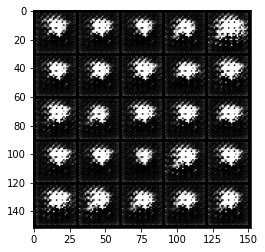

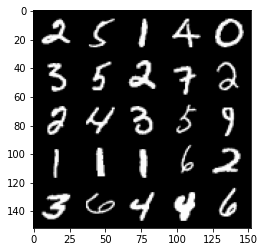

Loss Generator: 4.0421 / Loss Discriminator 0.0638: 100%|██████████| 469/469 [00:15<00:00, 29.42it/s]
Loss Generator: 2.9569 / Loss Discriminator 0.2013:  39%|███▉      | 185/469 [00:06<00:08, 32.07it/s]

Epochs : 6 , steps : 3000


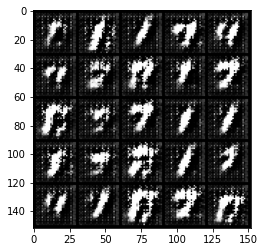

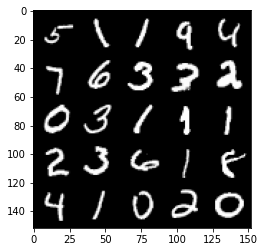

Loss Generator: 2.8591 / Loss Discriminator 0.2033: 100%|██████████| 469/469 [00:16<00:00, 28.97it/s]
Loss Generator: 2.4901 / Loss Discriminator 0.2345:  46%|████▌     | 216/469 [00:07<00:08, 29.74it/s]

Epochs : 7 , steps : 3500


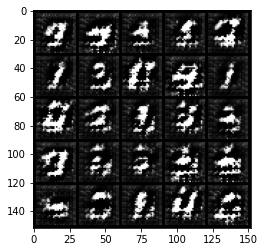

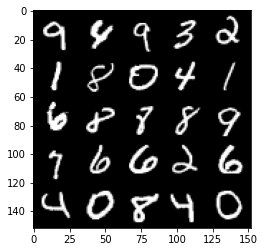

Loss Generator: 2.3048 / Loss Discriminator 0.2574: 100%|██████████| 469/469 [00:15<00:00, 29.35it/s]
Loss Generator: 1.9787 / Loss Discriminator 0.3018:  53%|█████▎    | 247/469 [00:08<00:07, 30.33it/s]

Epochs : 8 , steps : 4000


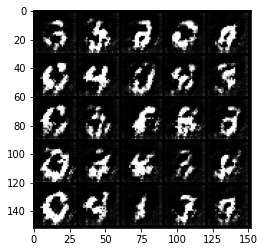

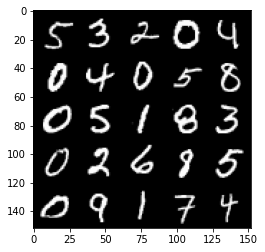

Loss Generator: 1.9758 / Loss Discriminator 0.3234: 100%|██████████| 469/469 [00:16<00:00, 28.96it/s]
Loss Generator: 1.9093 / Loss Discriminator 0.3909:  59%|█████▊    | 275/469 [00:09<00:06, 28.20it/s]

Epochs : 9 , steps : 4500


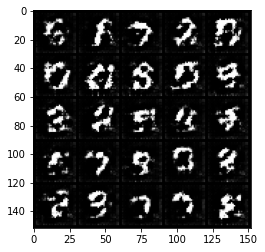

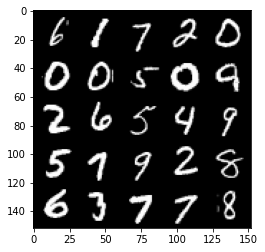

Loss Generator: 1.8847 / Loss Discriminator 0.3941: 100%|██████████| 469/469 [00:15<00:00, 30.09it/s]
Loss Generator: 1.9718 / Loss Discriminator 0.3939:  66%|██████▌   | 308/469 [00:10<00:05, 31.65it/s]

Epochs : 10 , steps : 5000


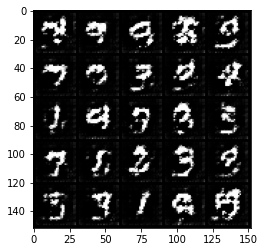

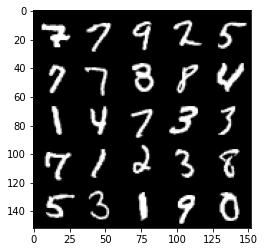

Loss Generator: 1.9047 / Loss Discriminator 0.389: 100%|██████████| 469/469 [00:15<00:00, 29.66it/s]
Loss Generator: 1.6612 / Loss Discriminator 0.4011:  72%|███████▏  | 338/469 [00:11<00:04, 29.90it/s]

Epochs : 11 , steps : 5500


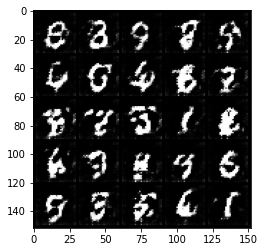

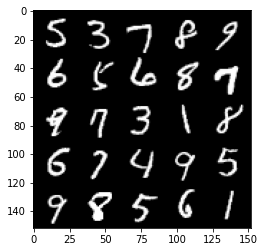

Loss Generator: 1.6436 / Loss Discriminator 0.4028: 100%|██████████| 469/469 [00:15<00:00, 29.76it/s]
Loss Generator: 1.7166 / Loss Discriminator 0.4045:  79%|███████▊  | 369/469 [00:12<00:03, 29.93it/s]

Epochs : 12 , steps : 6000


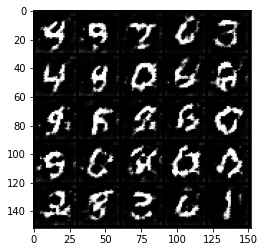

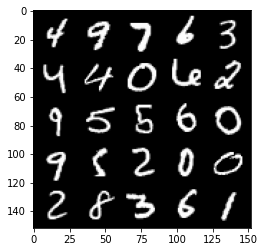

Loss Generator: 1.6881 / Loss Discriminator 0.4124: 100%|██████████| 469/469 [00:15<00:00, 29.93it/s]
Loss Generator: 1.6575 / Loss Discriminator 0.4075:  85%|████████▌ | 399/469 [00:13<00:02, 30.73it/s]

Epochs : 13 , steps : 6500


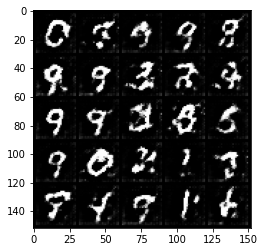

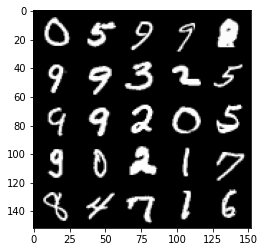

Loss Generator: 1.6474 / Loss Discriminator 0.4163: 100%|██████████| 469/469 [00:15<00:00, 29.89it/s]
Loss Generator: 1.5195 / Loss Discriminator 0.466:  92%|█████████▏| 432/469 [00:14<00:01, 27.57it/s]

Epochs : 14 , steps : 7000


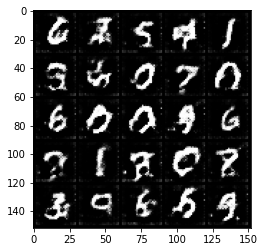

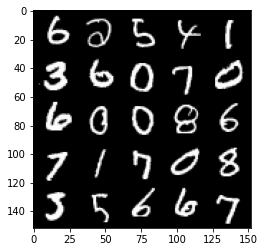

Loss Generator: 1.5214 / Loss Discriminator 0.4634: 100%|██████████| 469/469 [00:16<00:00, 29.29it/s]
Loss Generator: 1.4012 / Loss Discriminator 0.5075:  99%|█████████▉| 464/469 [00:15<00:00, 27.92it/s]

Epochs : 15 , steps : 7500


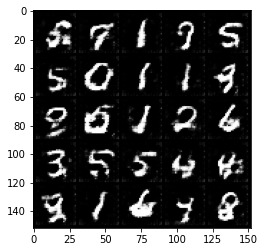

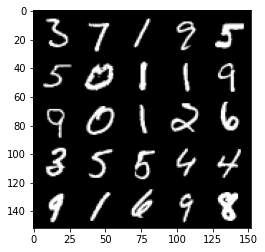

Loss Generator: 1.3999 / Loss Discriminator 0.5076: 100%|██████████| 469/469 [00:15<00:00, 29.34it/s]
Loss Generator: 1.3281 / Loss Discriminator 0.5418: 100%|██████████| 469/469 [00:15<00:00, 30.01it/s]
Loss Generator: 1.2762 / Loss Discriminator 0.51:   6%|▌         | 26/469 [00:00<00:15, 27.91it/s]

Epochs : 17 , steps : 8000


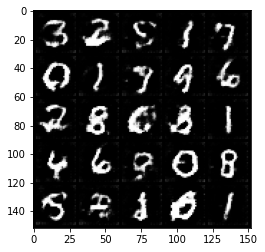

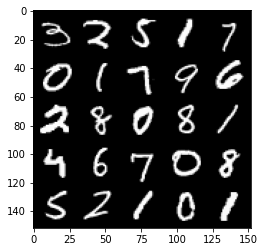

Loss Generator: 1.1614 / Loss Discriminator 0.5611: 100%|██████████| 469/469 [00:15<00:00, 29.72it/s]
Loss Generator: 1.0817 / Loss Discriminator 0.606:  12%|█▏        | 56/469 [00:02<00:14, 29.22it/s]

Epochs : 18 , steps : 8500


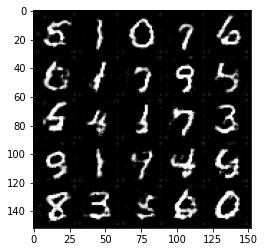

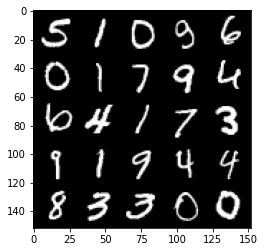

Loss Generator: 1.1499 / Loss Discriminator 0.5765: 100%|██████████| 469/469 [00:16<00:00, 28.29it/s]
Loss Generator: 1.1161 / Loss Discriminator 0.5975:  18%|█▊        | 86/469 [00:02<00:12, 31.68it/s]

Epochs : 19 , steps : 9000


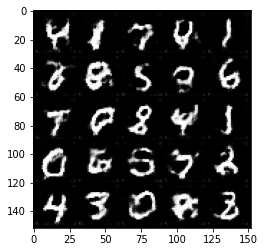

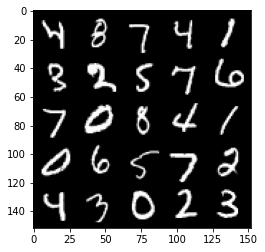

Loss Generator: 1.1462 / Loss Discriminator 0.5945: 100%|██████████| 469/469 [00:15<00:00, 29.36it/s]
Loss Generator: 1.1734 / Loss Discriminator 0.5942:  25%|██▌       | 118/469 [00:03<00:11, 31.64it/s]

Epochs : 20 , steps : 9500


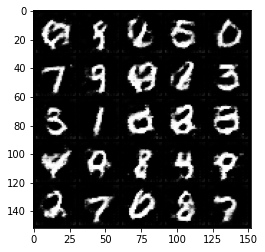

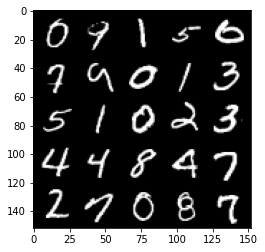

Loss Generator: 1.1163 / Loss Discriminator 0.5856: 100%|██████████| 469/469 [00:15<00:00, 29.42it/s]
Loss Generator: 1.1004 / Loss Discriminator 0.5988:  32%|███▏      | 150/469 [00:04<00:10, 31.53it/s]

Epochs : 21 , steps : 10000


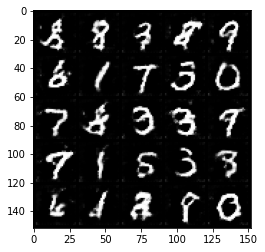

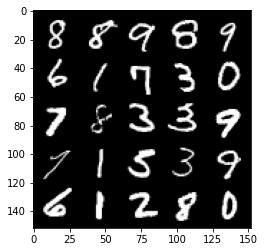

Loss Generator: 1.0902 / Loss Discriminator 0.5972: 100%|██████████| 469/469 [00:15<00:00, 29.37it/s]
Loss Generator: 1.0793 / Loss Discriminator 0.601:  38%|███▊      | 179/469 [00:06<00:10, 28.14it/s]

Epochs : 22 , steps : 10500


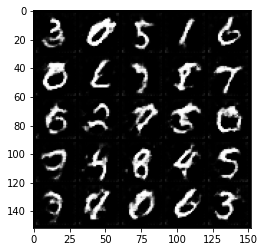

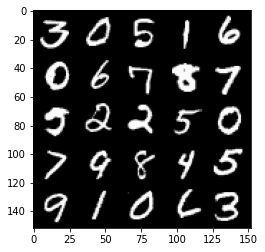

Loss Generator: 1.0767 / Loss Discriminator 0.6103: 100%|██████████| 469/469 [00:16<00:00, 29.03it/s]
Loss Generator: 1.027 / Loss Discriminator 0.6154:  45%|████▌     | 212/469 [00:07<00:08, 29.44it/s]

Epochs : 23 , steps : 11000


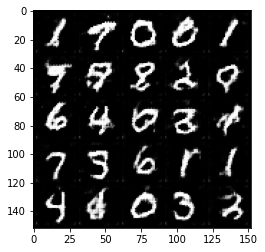

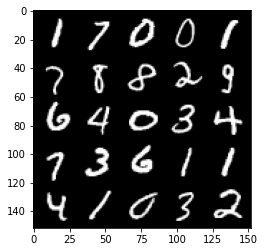

Loss Generator: 1.0028 / Loss Discriminator 0.6243: 100%|██████████| 469/469 [00:15<00:00, 29.34it/s]
Loss Generator: 1.0135 / Loss Discriminator 0.6155:  52%|█████▏    | 242/469 [00:07<00:07, 31.86it/s]

Epochs : 24 , steps : 11500


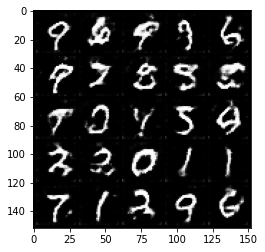

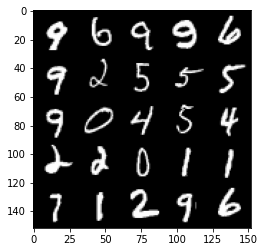

Loss Generator: 1.004 / Loss Discriminator 0.6203: 100%|██████████| 469/469 [00:15<00:00, 30.25it/s]
Loss Generator: 1.0119 / Loss Discriminator 0.6383:  58%|█████▊    | 272/469 [00:09<00:06, 28.26it/s]

Epochs : 25 , steps : 12000


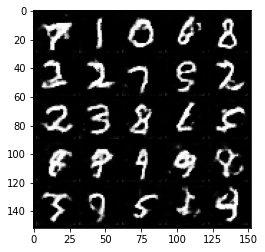

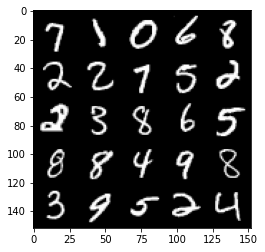

Loss Generator: 0.9901 / Loss Discriminator 0.6377: 100%|██████████| 469/469 [00:16<00:00, 29.12it/s]
Loss Generator: 0.9299 / Loss Discriminator 0.6467:  65%|██████▌   | 305/469 [00:10<00:05, 30.81it/s]

Epochs : 26 , steps : 12500


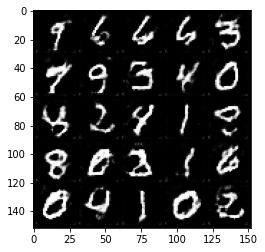

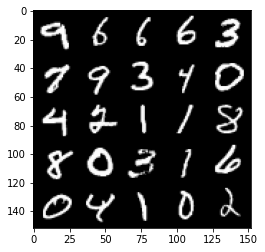

Loss Generator: 0.9428 / Loss Discriminator 0.6409: 100%|██████████| 469/469 [00:15<00:00, 29.63it/s]
Loss Generator: 0.9716 / Loss Discriminator 0.645:  72%|███████▏  | 336/469 [00:11<00:04, 27.45it/s]

Epochs : 27 , steps : 13000


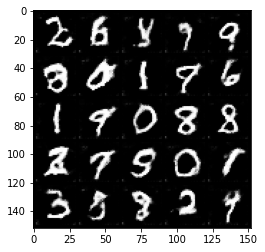

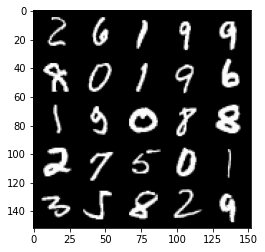

Loss Generator: 0.9667 / Loss Discriminator 0.6528: 100%|██████████| 469/469 [00:16<00:00, 28.98it/s]
Loss Generator: 0.9343 / Loss Discriminator 0.6489:  78%|███████▊  | 365/469 [00:12<00:03, 31.23it/s]

Epochs : 28 , steps : 13500


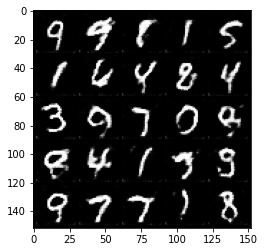

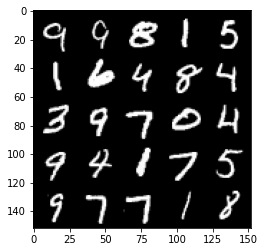

Loss Generator: 0.9294 / Loss Discriminator 0.6497: 100%|██████████| 469/469 [00:15<00:00, 29.64it/s]
Loss Generator: 0.9422 / Loss Discriminator 0.6505:  85%|████████▍ | 398/469 [00:12<00:02, 28.33it/s]

Epochs : 29 , steps : 14000


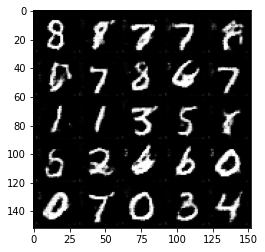

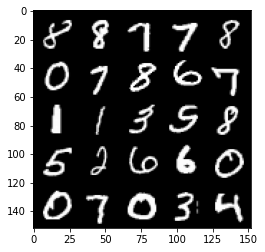

Loss Generator: 0.9333 / Loss Discriminator 0.654: 100%|██████████| 469/469 [00:15<00:00, 30.33it/s]
Loss Generator: 0.9073 / Loss Discriminator 0.6582:  91%|█████████▏| 428/469 [00:14<00:01, 30.37it/s]

Epochs : 30 , steps : 14500


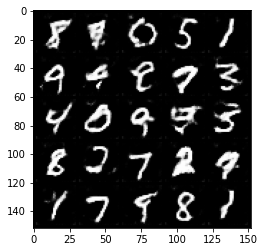

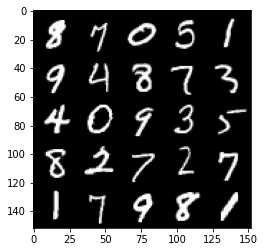

Loss Generator: 0.9097 / Loss Discriminator 0.6582: 100%|██████████| 469/469 [00:16<00:00, 29.19it/s]
Loss Generator: 0.9167 / Loss Discriminator 0.6544:  98%|█████████▊| 459/469 [00:15<00:00, 27.91it/s]

Epochs : 31 , steps : 15000


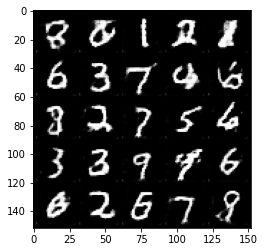

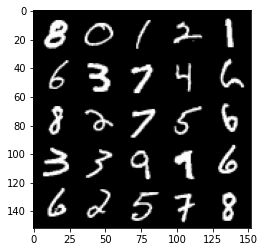

Loss Generator: 0.916 / Loss Discriminator 0.6549: 100%|██████████| 469/469 [00:15<00:00, 29.39it/s]
Loss Generator: 0.8808 / Loss Discriminator 0.6602: 100%|██████████| 469/469 [00:15<00:00, 30.79it/s]
Loss Generator: 0.8631 / Loss Discriminator 0.6629:   4%|▍         | 20/469 [00:00<00:14, 31.57it/s]

Epochs : 33 , steps : 15500


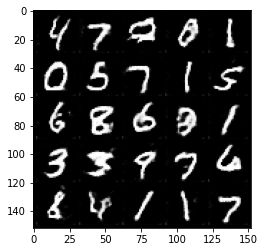

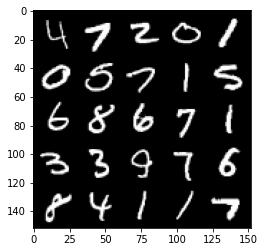

Loss Generator: 0.8749 / Loss Discriminator 0.6602: 100%|██████████| 469/469 [00:15<00:00, 30.45it/s]
Loss Generator: 0.8641 / Loss Discriminator 0.6635:  11%|█         | 51/469 [00:01<00:13, 32.09it/s]

Epochs : 34 , steps : 16000


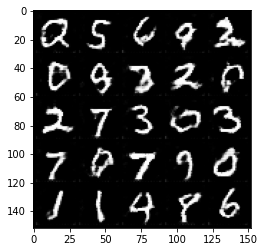

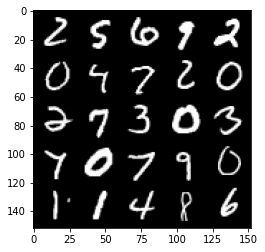

Loss Generator: 0.8549 / Loss Discriminator 0.6663: 100%|██████████| 469/469 [00:15<00:00, 30.08it/s]
Loss Generator: 0.8954 / Loss Discriminator 0.6426:  18%|█▊        | 84/469 [00:02<00:11, 33.04it/s]

Epochs : 35 , steps : 16500


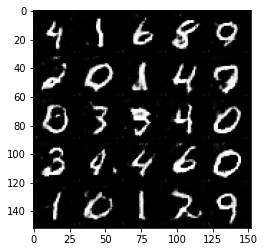

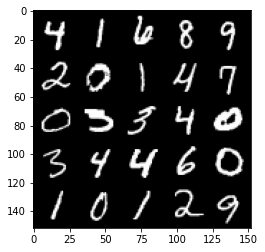

Loss Generator: 0.9143 / Loss Discriminator 0.6605: 100%|██████████| 469/469 [00:15<00:00, 30.17it/s]
Loss Generator: 0.8886 / Loss Discriminator 0.6683:  24%|██▍       | 114/469 [00:03<00:12, 29.34it/s]

Epochs : 36 , steps : 17000


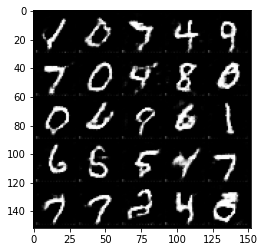

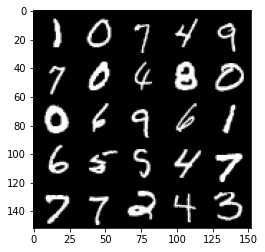

Loss Generator: 0.8723 / Loss Discriminator 0.6627: 100%|██████████| 469/469 [00:15<00:00, 29.72it/s]
Loss Generator: 0.8421 / Loss Discriminator 0.6705:  30%|███       | 143/469 [00:04<00:10, 30.26it/s]

Epochs : 37 , steps : 17500


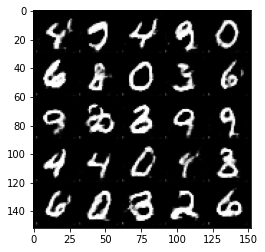

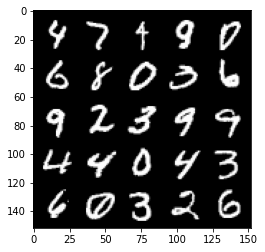

Loss Generator: 0.8478 / Loss Discriminator 0.6696: 100%|██████████| 469/469 [00:15<00:00, 29.96it/s]
Loss Generator: 0.8645 / Loss Discriminator 0.6672:  38%|███▊      | 176/469 [00:06<00:10, 26.94it/s]

Epochs : 38 , steps : 18000


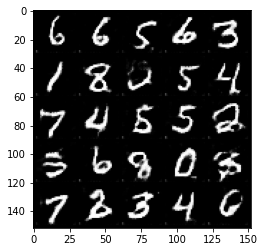

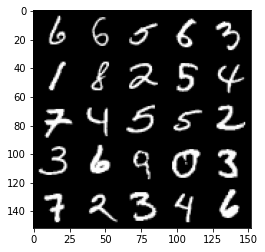

Loss Generator: 0.8615 / Loss Discriminator 0.6661: 100%|██████████| 469/469 [00:16<00:00, 28.32it/s]
Loss Generator: 0.8458 / Loss Discriminator 0.6666:  44%|████▍     | 208/469 [00:06<00:09, 27.79it/s]

Epochs : 39 , steps : 18500


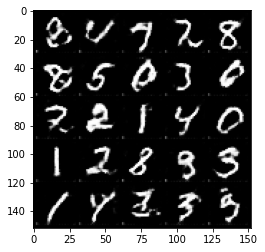

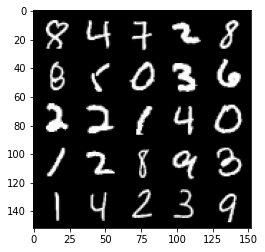

Loss Generator: 0.8418 / Loss Discriminator 0.6678: 100%|██████████| 469/469 [00:15<00:00, 29.85it/s]
Loss Generator: 0.8478 / Loss Discriminator 0.6714:  51%|█████     | 237/469 [00:08<00:08, 27.77it/s]

Epochs : 40 , steps : 19000


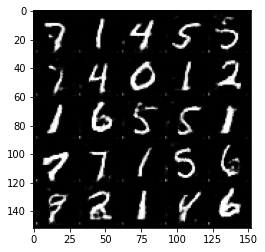

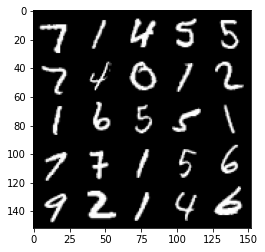

Loss Generator: 0.8439 / Loss Discriminator 0.6689: 100%|██████████| 469/469 [00:16<00:00, 29.01it/s]
Loss Generator: 0.8183 / Loss Discriminator 0.6731:  58%|█████▊    | 270/469 [00:08<00:07, 28.33it/s]

Epochs : 41 , steps : 19500


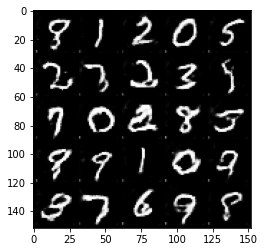

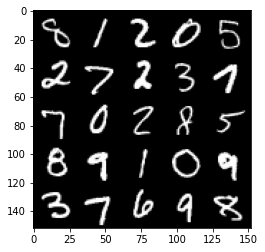

Loss Generator: 0.8204 / Loss Discriminator 0.672: 100%|██████████| 469/469 [00:15<00:00, 29.80it/s]
Loss Generator: 0.8314 / Loss Discriminator 0.6805:  64%|██████▍   | 299/469 [00:10<00:05, 28.61it/s]

Epochs : 42 , steps : 20000


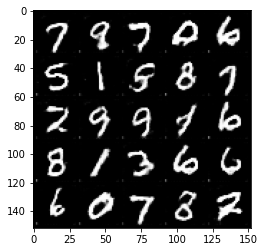

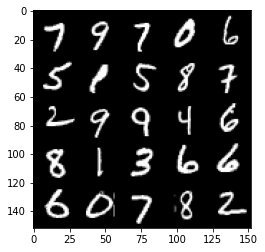

Loss Generator: 0.8309 / Loss Discriminator 0.6789: 100%|██████████| 469/469 [00:16<00:00, 29.22it/s]
Loss Generator: 0.8361 / Loss Discriminator 0.6703:  71%|███████   | 331/469 [00:11<00:05, 27.36it/s]

Epochs : 43 , steps : 20500


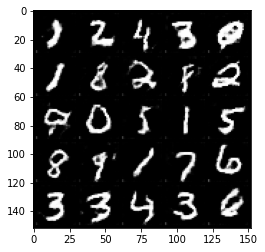

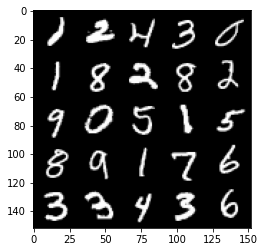

Loss Generator: 0.8444 / Loss Discriminator 0.6704: 100%|██████████| 469/469 [00:16<00:00, 28.61it/s]
Loss Generator: 0.8364 / Loss Discriminator 0.6734:  77%|███████▋  | 363/469 [00:12<00:03, 31.25it/s]

Epochs : 44 , steps : 21000


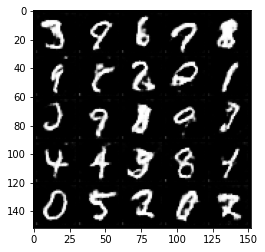

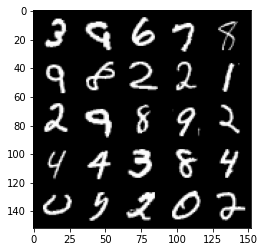

Loss Generator: 0.8398 / Loss Discriminator 0.6712: 100%|██████████| 469/469 [00:15<00:00, 29.43it/s]
Loss Generator: 0.8211 / Loss Discriminator 0.6761:  84%|████████▍ | 393/469 [00:13<00:02, 29.24it/s]

Epochs : 45 , steps : 21500


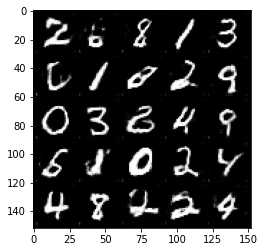

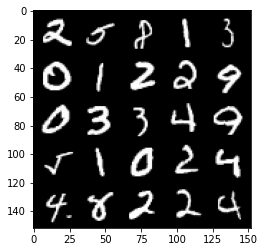

Loss Generator: 0.8249 / Loss Discriminator 0.6744: 100%|██████████| 469/469 [00:16<00:00, 29.21it/s]
Loss Generator: 0.8166 / Loss Discriminator 0.6793:  91%|█████████ | 425/469 [00:14<00:01, 27.90it/s]

Epochs : 46 , steps : 22000


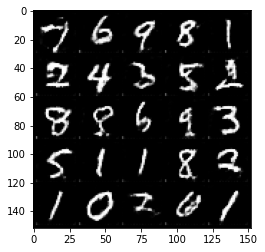

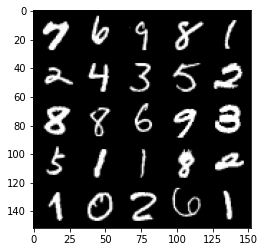

Loss Generator: 0.8182 / Loss Discriminator 0.6777: 100%|██████████| 469/469 [00:16<00:00, 28.99it/s]
Loss Generator: 0.8208 / Loss Discriminator 0.6744:  97%|█████████▋| 454/469 [00:14<00:00, 29.95it/s]

Epochs : 47 , steps : 22500


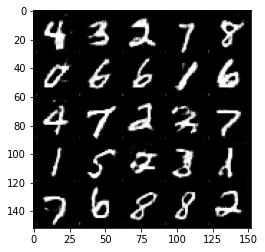

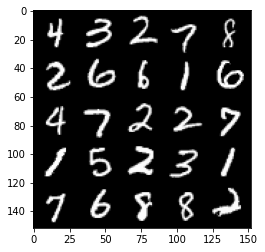

Loss Generator: 0.82 / Loss Discriminator 0.6743: 100%|██████████| 469/469 [00:15<00:00, 30.02it/s]
Loss Generator: 0.7947 / Loss Discriminator 0.6756: 100%|██████████| 469/469 [00:15<00:00, 30.75it/s]
Loss Generator: 0.7889 / Loss Discriminator 0.6838:   3%|▎         | 16/469 [00:00<00:13, 32.51it/s]

Epochs : 49 , steps : 23000


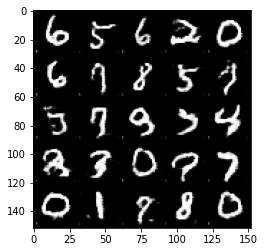

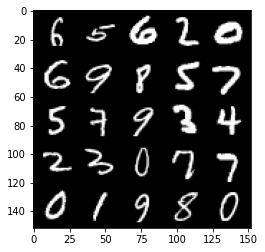

Loss Generator: 0.807 / Loss Discriminator 0.6773: 100%|██████████| 469/469 [00:15<00:00, 29.82it/s]
Loss Generator: 0.8121 / Loss Discriminator 0.6644:  10%|█         | 48/469 [00:01<00:13, 32.01it/s]

Epochs : 50 , steps : 23500


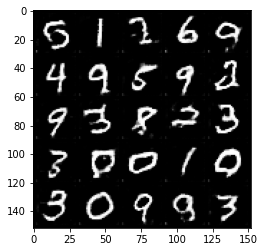

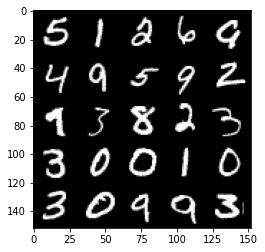

Loss Generator: 0.826 / Loss Discriminator 0.6759: 100%|██████████| 469/469 [00:15<00:00, 29.82it/s]
Loss Generator: 0.8119 / Loss Discriminator 0.681:  17%|█▋        | 79/469 [00:02<00:12, 31.41it/s]

Epochs : 51 , steps : 24000


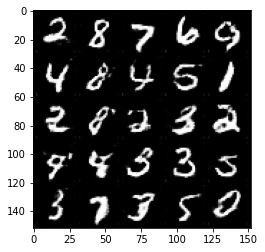

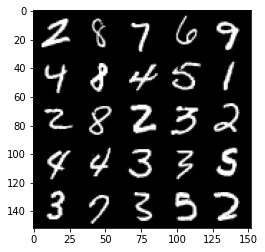

Loss Generator: 0.8017 / Loss Discriminator 0.6792: 100%|██████████| 469/469 [00:15<00:00, 29.85it/s]
Loss Generator: 0.826 / Loss Discriminator 0.6578:  23%|██▎       | 109/469 [00:03<00:11, 32.29it/s]

Epochs : 52 , steps : 24500


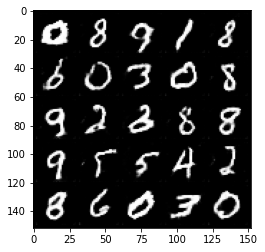

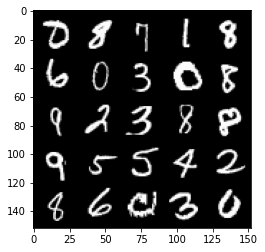

Loss Generator: 0.8033 / Loss Discriminator 0.6745: 100%|██████████| 469/469 [00:15<00:00, 29.96it/s]
Loss Generator: 0.7974 / Loss Discriminator 0.6895:  30%|██▉       | 140/469 [00:04<00:11, 28.55it/s]

Epochs : 53 , steps : 25000


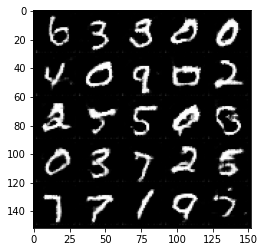

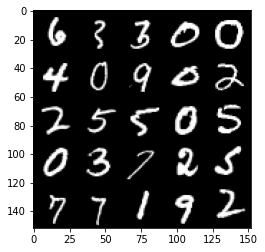

Loss Generator: 0.8136 / Loss Discriminator 0.6774: 100%|██████████| 469/469 [00:15<00:00, 30.48it/s]
Loss Generator: 0.8111 / Loss Discriminator 0.6786:  36%|███▋      | 171/469 [00:05<00:09, 31.36it/s]

Epochs : 54 , steps : 25500


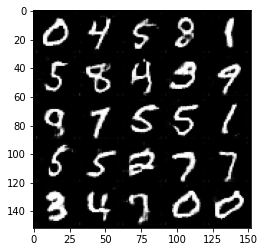

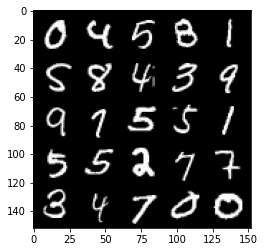

Loss Generator: 0.8064 / Loss Discriminator 0.6813: 100%|██████████| 469/469 [00:15<00:00, 30.89it/s]
Loss Generator: 0.7791 / Loss Discriminator 0.6756:  43%|████▎     | 202/469 [00:06<00:08, 31.81it/s]

Epochs : 55 , steps : 26000


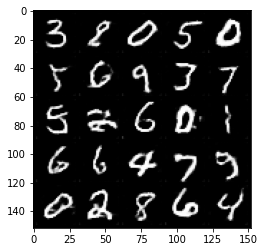

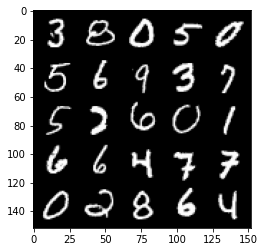

Loss Generator: 0.7784 / Loss Discriminator 0.6776: 100%|██████████| 469/469 [00:15<00:00, 30.83it/s]
Loss Generator: 0.7766 / Loss Discriminator 0.6844:  50%|████▉     | 234/469 [00:07<00:07, 29.80it/s]

Epochs : 56 , steps : 26500


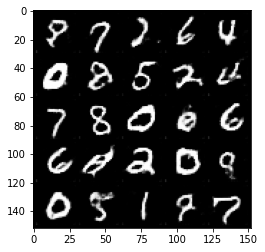

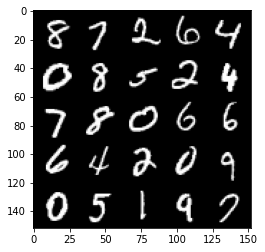

Loss Generator: 0.7773 / Loss Discriminator 0.6849: 100%|██████████| 469/469 [00:15<00:00, 30.77it/s]
Loss Generator: 0.822 / Loss Discriminator 0.6698:  57%|█████▋    | 266/469 [00:08<00:06, 31.26it/s]

Epochs : 57 , steps : 27000


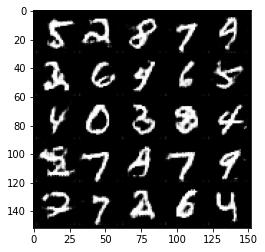

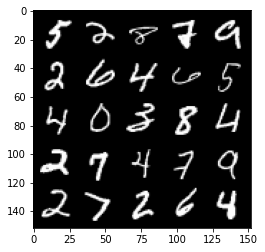

Loss Generator: 0.8166 / Loss Discriminator 0.6749: 100%|██████████| 469/469 [00:15<00:00, 29.40it/s]
Loss Generator: 0.7954 / Loss Discriminator 0.6839:  63%|██████▎   | 296/469 [00:09<00:05, 31.50it/s]

Epochs : 58 , steps : 27500


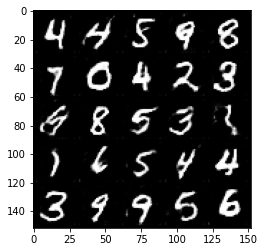

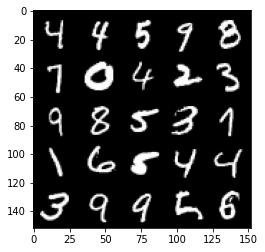

Loss Generator: 0.7936 / Loss Discriminator 0.6845: 100%|██████████| 469/469 [00:15<00:00, 30.27it/s]
Loss Generator: 0.7869 / Loss Discriminator 0.6787:  70%|██████▉   | 326/469 [00:10<00:04, 31.13it/s]

Epochs : 59 , steps : 28000


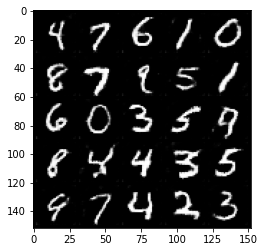

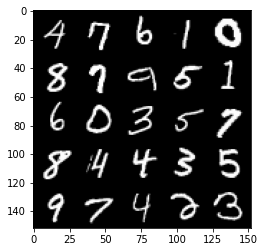

Loss Generator: 0.7877 / Loss Discriminator 0.6771: 100%|██████████| 469/469 [00:15<00:00, 29.58it/s]
Loss Generator: 0.7955 / Loss Discriminator 0.6818:  76%|███████▌  | 356/469 [00:11<00:03, 31.89it/s]

Epochs : 60 , steps : 28500


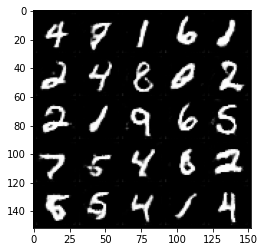

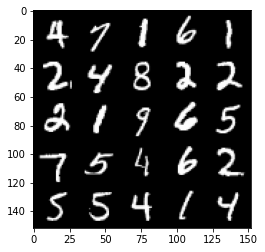

Loss Generator: 0.7948 / Loss Discriminator 0.6817: 100%|██████████| 469/469 [00:15<00:00, 30.08it/s]
Loss Generator: 0.786 / Loss Discriminator 0.6805:  83%|████████▎ | 388/469 [00:13<00:02, 29.54it/s]

Epochs : 61 , steps : 29000


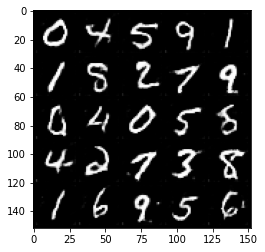

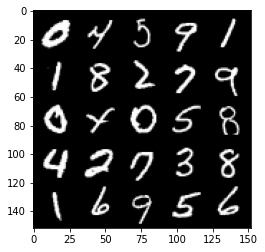

Loss Generator: 0.7837 / Loss Discriminator 0.6846: 100%|██████████| 469/469 [00:15<00:00, 29.33it/s]
Loss Generator: 0.7891 / Loss Discriminator 0.6814:  90%|████████▉ | 421/469 [00:13<00:01, 31.85it/s]

Epochs : 62 , steps : 29500


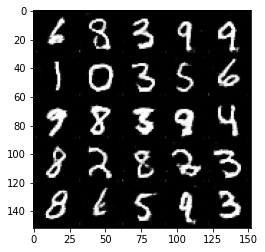

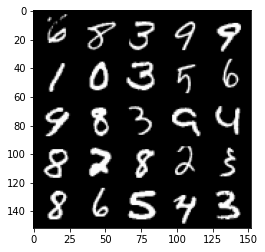

Loss Generator: 0.7889 / Loss Discriminator 0.6797: 100%|██████████| 469/469 [00:15<00:00, 30.08it/s]
Loss Generator: 0.7789 / Loss Discriminator 0.6832:  96%|█████████▌| 450/469 [00:14<00:00, 30.93it/s]

Epochs : 63 , steps : 30000


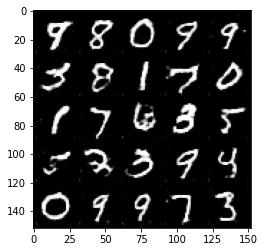

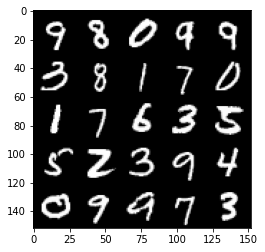

Loss Generator: 0.777 / Loss Discriminator 0.6843: 100%|██████████| 469/469 [00:15<00:00, 29.70it/s]
Loss Generator: 0.7975 / Loss Discriminator 0.6798: 100%|██████████| 469/469 [00:15<00:00, 31.24it/s]
Loss Generator: 0.8506 / Loss Discriminator 0.6437:   3%|▎         | 12/469 [00:00<00:14, 31.94it/s]

Epochs : 65 , steps : 30500


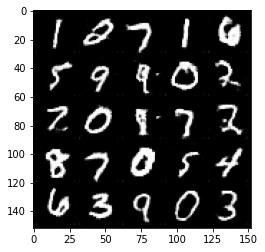

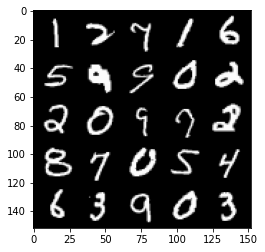

Loss Generator: 0.7865 / Loss Discriminator 0.6794: 100%|██████████| 469/469 [00:15<00:00, 29.55it/s]
Loss Generator: 0.7874 / Loss Discriminator 0.6629:   9%|▉         | 42/469 [00:01<00:15, 28.36it/s]

Epochs : 66 , steps : 31000


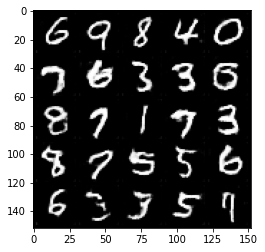

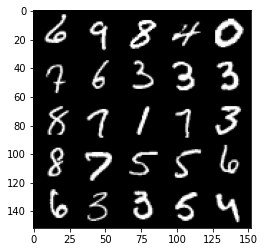

Loss Generator: 0.7708 / Loss Discriminator 0.6813: 100%|██████████| 469/469 [00:15<00:00, 30.31it/s]
Loss Generator: 0.7791 / Loss Discriminator 0.6721:  16%|█▌        | 74/469 [00:02<00:12, 31.45it/s]

Epochs : 67 , steps : 31500


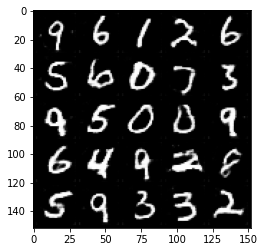

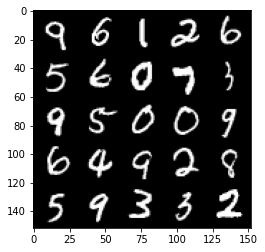

Loss Generator: 0.7746 / Loss Discriminator 0.6784: 100%|██████████| 469/469 [00:15<00:00, 30.71it/s]
Loss Generator: 0.7794 / Loss Discriminator 0.6816:  23%|██▎       | 107/469 [00:03<00:12, 29.70it/s]

Epochs : 68 , steps : 32000


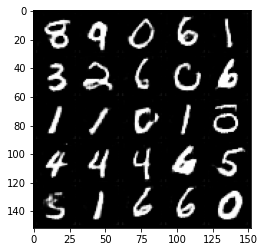

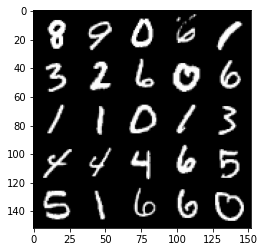

Loss Generator: 0.7734 / Loss Discriminator 0.683: 100%|██████████| 469/469 [00:15<00:00, 29.84it/s]
Loss Generator: 0.7765 / Loss Discriminator 0.6876:  29%|██▉       | 138/469 [00:04<00:10, 32.12it/s]

Epochs : 69 , steps : 32500


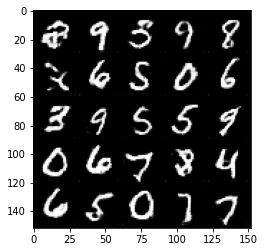

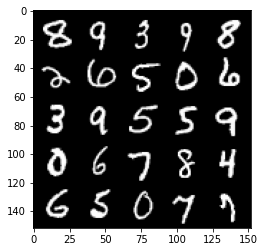

Loss Generator: 0.7751 / Loss Discriminator 0.6856: 100%|██████████| 469/469 [00:15<00:00, 30.78it/s]
Loss Generator: 0.7749 / Loss Discriminator 0.6887:  36%|███▌      | 168/469 [00:05<00:09, 31.46it/s]

Epochs : 70 , steps : 33000


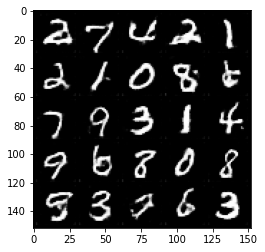

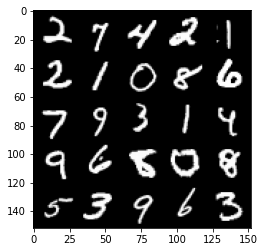

Loss Generator: 0.7799 / Loss Discriminator 0.6843: 100%|██████████| 469/469 [00:14<00:00, 31.43it/s]
Loss Generator: 0.7827 / Loss Discriminator 0.6798:  42%|████▏     | 197/469 [00:06<00:08, 32.09it/s]

Epochs : 71 , steps : 33500


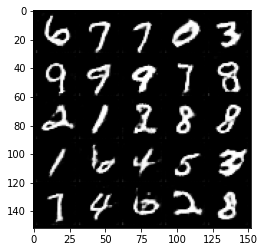

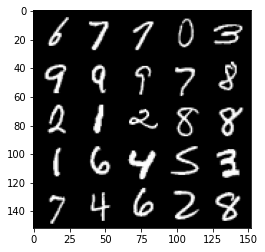

Loss Generator: 0.7778 / Loss Discriminator 0.682: 100%|██████████| 469/469 [00:15<00:00, 30.70it/s]
Loss Generator: 0.7716 / Loss Discriminator 0.6877:  49%|████▊     | 228/469 [00:07<00:07, 30.28it/s]

Epochs : 72 , steps : 34000


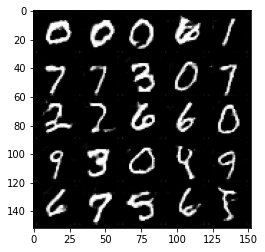

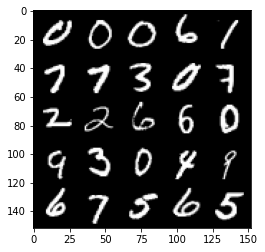

Loss Generator: 0.7683 / Loss Discriminator 0.6894: 100%|██████████| 469/469 [00:14<00:00, 31.33it/s]
Loss Generator: 0.7666 / Loss Discriminator 0.6874:  56%|█████▌    | 261/469 [00:08<00:06, 31.60it/s]

Epochs : 73 , steps : 34500


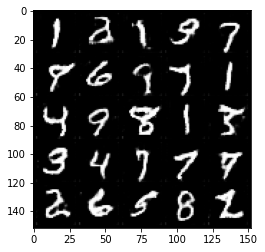

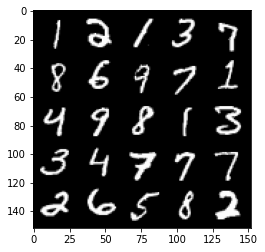

Loss Generator: 0.7622 / Loss Discriminator 0.6874: 100%|██████████| 469/469 [00:15<00:00, 30.18it/s]
Loss Generator: 0.7685 / Loss Discriminator 0.6834:  62%|██████▏   | 292/469 [00:09<00:06, 28.37it/s]

Epochs : 74 , steps : 35000


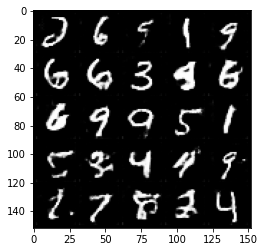

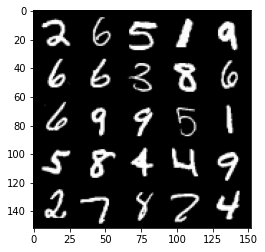

Loss Generator: 0.7706 / Loss Discriminator 0.6818: 100%|██████████| 469/469 [00:15<00:00, 30.96it/s]
Loss Generator: 0.7518 / Loss Discriminator 0.6854:  69%|██████▉   | 324/469 [00:10<00:05, 28.57it/s]

Epochs : 75 , steps : 35500


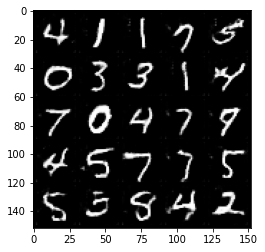

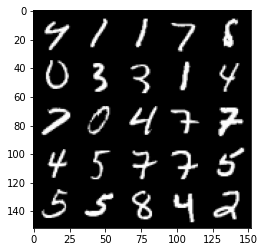

Loss Generator: 0.7571 / Loss Discriminator 0.6843: 100%|██████████| 469/469 [00:15<00:00, 30.17it/s]
Loss Generator: 0.7672 / Loss Discriminator 0.6851:  75%|███████▌  | 354/469 [00:10<00:03, 33.38it/s]

Epochs : 76 , steps : 36000


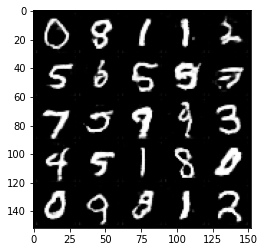

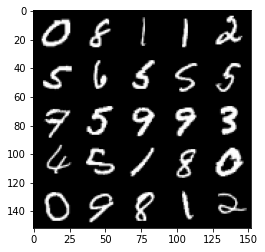

Loss Generator: 0.7625 / Loss Discriminator 0.6868: 100%|██████████| 469/469 [00:14<00:00, 31.88it/s]
Loss Generator: 0.7605 / Loss Discriminator 0.6857:  82%|████████▏ | 385/469 [00:12<00:03, 27.30it/s]

Epochs : 77 , steps : 36500


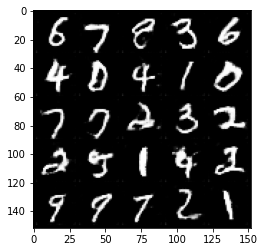

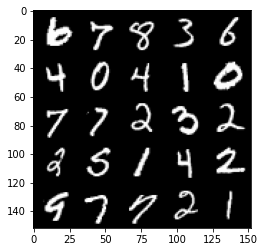

Loss Generator: 0.7626 / Loss Discriminator 0.6835: 100%|██████████| 469/469 [00:15<00:00, 29.53it/s]
Loss Generator: 0.75 / Loss Discriminator 0.6878:  88%|████████▊ | 415/469 [00:13<00:01, 28.80it/s]

Epochs : 78 , steps : 37000


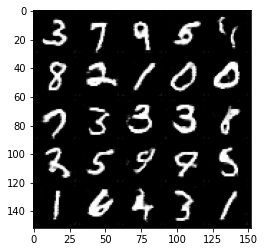

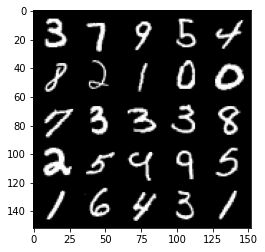

Loss Generator: 0.7516 / Loss Discriminator 0.6878: 100%|██████████| 469/469 [00:15<00:00, 30.33it/s]
Loss Generator: 0.7471 / Loss Discriminator 0.6841:  95%|█████████▌| 447/469 [00:14<00:00, 27.89it/s]

Epochs : 79 , steps : 37500


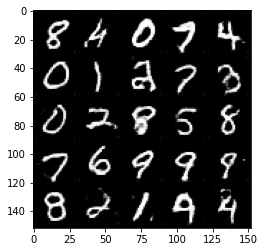

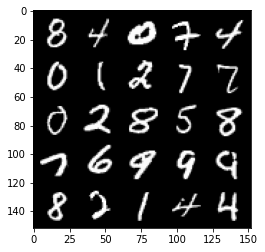

Loss Generator: 0.7476 / Loss Discriminator 0.6837: 100%|██████████| 469/469 [00:15<00:00, 30.62it/s]
Loss Generator: 0.7528 / Loss Discriminator 0.6878: 100%|██████████| 469/469 [00:15<00:00, 31.14it/s]
Loss Generator: 0.7463 / Loss Discriminator 0.696:   2%|▏         | 8/469 [00:00<00:14, 32.23it/s]

Epochs : 81 , steps : 38000


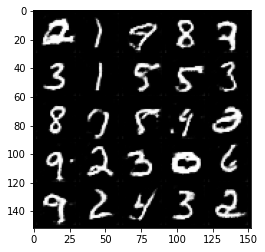

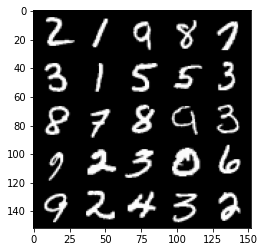

Loss Generator: 0.76 / Loss Discriminator 0.6836: 100%|██████████| 469/469 [00:15<00:00, 29.44it/s]
Loss Generator: 0.7025 / Loss Discriminator 0.734:   9%|▊         | 40/469 [00:01<00:13, 31.67it/s]

Epochs : 82 , steps : 38500


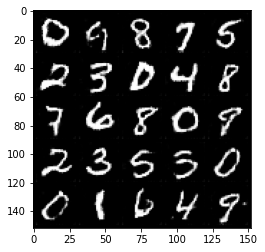

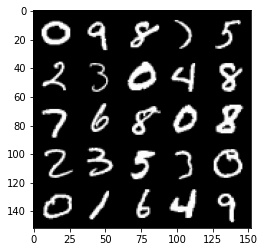

Loss Generator: 0.7722 / Loss Discriminator 0.6871: 100%|██████████| 469/469 [00:15<00:00, 31.21it/s]
Loss Generator: 0.735 / Loss Discriminator 0.7157:  15%|█▌        | 71/469 [00:02<00:12, 30.94it/s]

Epochs : 83 , steps : 39000


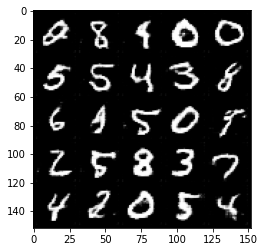

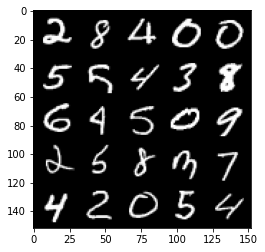

Loss Generator: 0.7487 / Loss Discriminator 0.6908: 100%|██████████| 469/469 [00:15<00:00, 29.94it/s]
Loss Generator: 0.7445 / Loss Discriminator 0.686:  22%|██▏       | 101/469 [00:03<00:12, 28.76it/s]

Epochs : 84 , steps : 39500


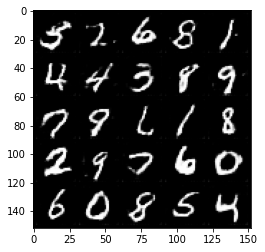

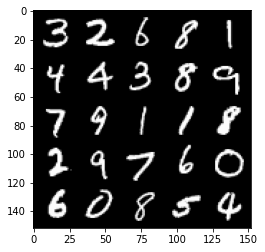

Loss Generator: 0.7542 / Loss Discriminator 0.6851: 100%|██████████| 469/469 [00:15<00:00, 30.17it/s]
Loss Generator: 0.749 / Loss Discriminator 0.693:  28%|██▊       | 131/469 [00:04<00:10, 32.59it/s]

Epochs : 85 , steps : 40000


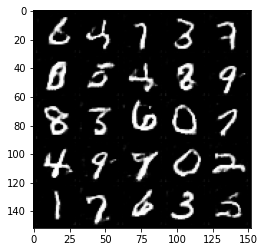

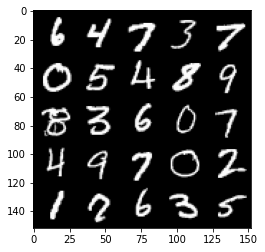

Loss Generator: 0.7508 / Loss Discriminator 0.6888: 100%|██████████| 469/469 [00:15<00:00, 30.09it/s]
Loss Generator: 0.7467 / Loss Discriminator 0.6864:  35%|███▍      | 163/469 [00:05<00:10, 28.55it/s]

Epochs : 86 , steps : 40500


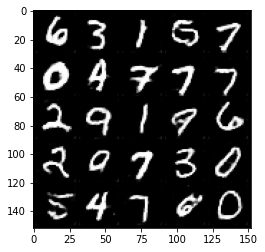

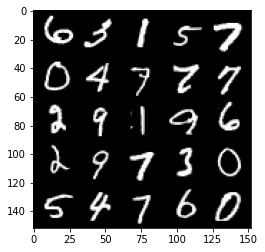

Loss Generator: 0.7458 / Loss Discriminator 0.6876: 100%|██████████| 469/469 [00:15<00:00, 29.95it/s]
Loss Generator: 0.7439 / Loss Discriminator 0.6875:  41%|████▏     | 194/469 [00:06<00:08, 31.85it/s]

Epochs : 87 , steps : 41000


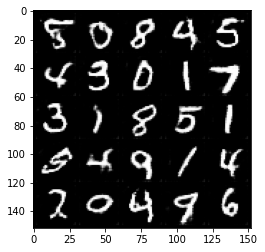

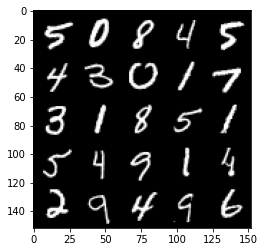

Loss Generator: 0.7525 / Loss Discriminator 0.6834: 100%|██████████| 469/469 [00:15<00:00, 29.48it/s]
Loss Generator: 0.7406 / Loss Discriminator 0.6915:  48%|████▊     | 227/469 [00:07<00:07, 32.13it/s]

Epochs : 88 , steps : 41500


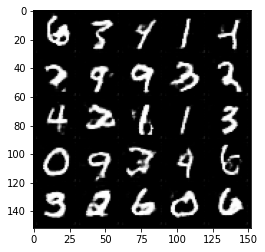

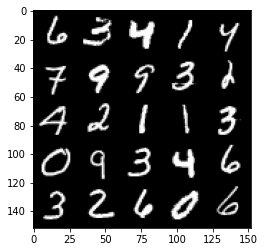

Loss Generator: 0.7456 / Loss Discriminator 0.6893: 100%|██████████| 469/469 [00:15<00:00, 30.77it/s]
Loss Generator: 0.7568 / Loss Discriminator 0.6946:  55%|█████▍    | 257/469 [00:08<00:06, 32.32it/s]

Epochs : 89 , steps : 42000


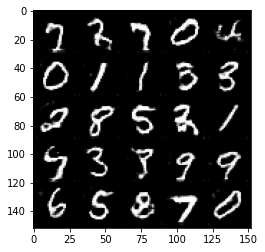

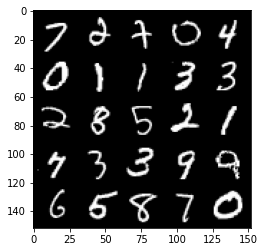

Loss Generator: 0.7585 / Loss Discriminator 0.6875: 100%|██████████| 469/469 [00:15<00:00, 30.28it/s]
Loss Generator: 0.7509 / Loss Discriminator 0.6849:  61%|██████▏   | 288/469 [00:09<00:05, 32.13it/s]

Epochs : 90 , steps : 42500


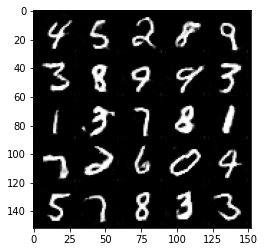

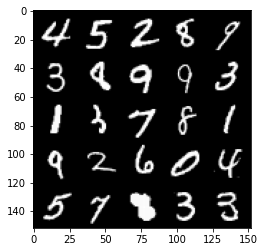

Loss Generator: 0.7452 / Loss Discriminator 0.6878: 100%|██████████| 469/469 [00:15<00:00, 30.95it/s]
Loss Generator: 0.7421 / Loss Discriminator 0.6867:  68%|██████▊   | 318/469 [00:10<00:04, 31.40it/s]

Epochs : 91 , steps : 43000


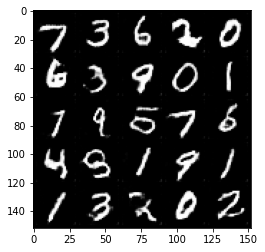

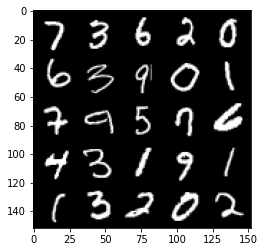

Loss Generator: 0.743 / Loss Discriminator 0.6869: 100%|██████████| 469/469 [00:15<00:00, 30.32it/s]
Loss Generator: 0.7369 / Loss Discriminator 0.6888:  75%|███████▍  | 351/469 [00:11<00:04, 28.43it/s]

Epochs : 92 , steps : 43500


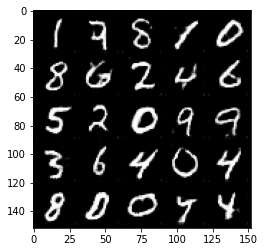

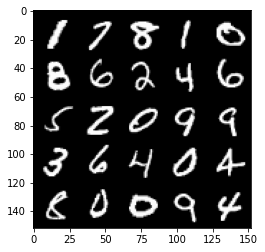

Loss Generator: 0.7383 / Loss Discriminator 0.6866: 100%|██████████| 469/469 [00:15<00:00, 29.91it/s]
Loss Generator: 0.7428 / Loss Discriminator 0.6858:  81%|████████  | 380/469 [00:12<00:02, 29.71it/s]

Epochs : 93 , steps : 44000


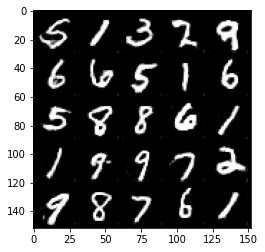

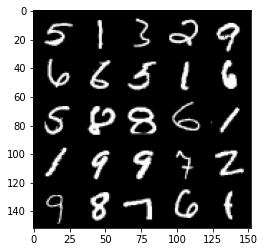

Loss Generator: 0.7424 / Loss Discriminator 0.6877: 100%|██████████| 469/469 [00:15<00:00, 30.29it/s]
Loss Generator: 0.7424 / Loss Discriminator 0.6857:  88%|████████▊ | 411/469 [00:12<00:01, 31.70it/s]

Epochs : 94 , steps : 44500


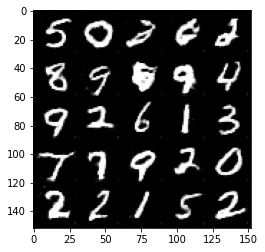

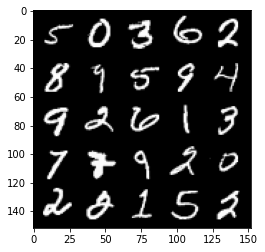

Loss Generator: 0.7419 / Loss Discriminator 0.6855: 100%|██████████| 469/469 [00:14<00:00, 31.44it/s]
Loss Generator: 0.7509 / Loss Discriminator 0.6832:  94%|█████████▍| 442/469 [00:14<00:00, 33.22it/s]

Epochs : 95 , steps : 45000


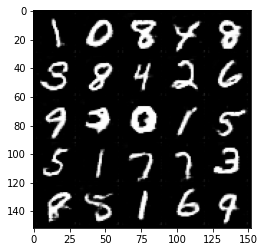

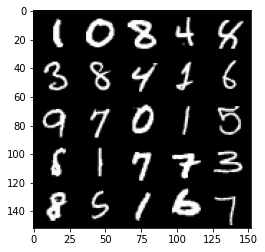

Loss Generator: 0.7522 / Loss Discriminator 0.6828: 100%|██████████| 469/469 [00:15<00:00, 31.01it/s]
Loss Generator: 0.7381 / Loss Discriminator 0.685: 100%|██████████| 469/469 [00:15<00:00, 30.95it/s]
Loss Generator: 0.805 / Loss Discriminator 0.6533:   1%|          | 4/469 [00:00<00:14, 31.38it/s]

Epochs : 97 , steps : 45500


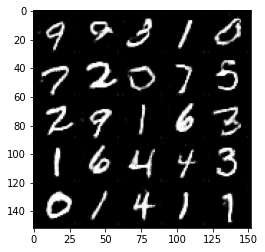

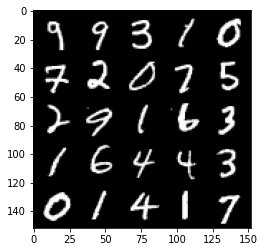

Loss Generator: 0.7364 / Loss Discriminator 0.6844: 100%|██████████| 469/469 [00:16<00:00, 29.06it/s]
Loss Generator: 0.7508 / Loss Discriminator 0.6801:   8%|▊         | 37/469 [00:01<00:14, 30.26it/s]

Epochs : 98 , steps : 46000


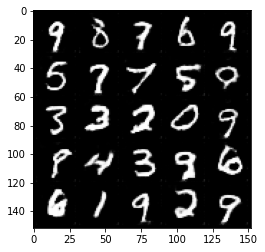

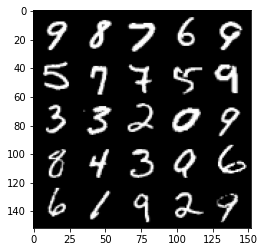

Loss Generator: 0.7421 / Loss Discriminator 0.6869: 100%|██████████| 469/469 [00:15<00:00, 31.12it/s]
Loss Generator: 0.7464 / Loss Discriminator 0.6882:  14%|█▍        | 67/469 [00:02<00:12, 31.50it/s]

Epochs : 99 , steps : 46500


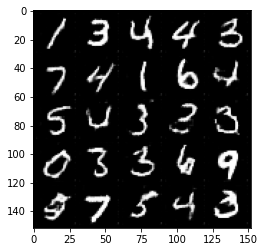

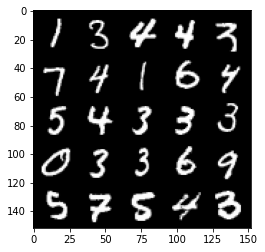

Loss Generator: 0.756 / Loss Discriminator 0.6827: 100%|██████████| 469/469 [00:15<00:00, 30.40it/s]
Loss Generator: 0.7607 / Loss Discriminator 0.6855:  20%|██        | 96/469 [00:03<00:11, 32.82it/s]

Epochs : 100 , steps : 47000


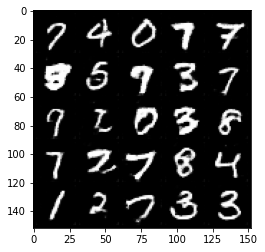

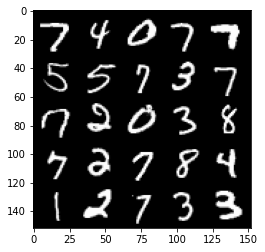

Loss Generator: 0.76 / Loss Discriminator 0.682: 100%|██████████| 469/469 [00:15<00:00, 31.07it/s]
Loss Generator: 0.7371 / Loss Discriminator 0.6853:  27%|██▋       | 127/469 [00:04<00:10, 32.33it/s]

Epochs : 101 , steps : 47500


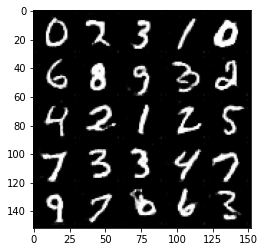

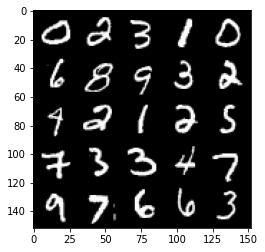

Loss Generator: 0.7375 / Loss Discriminator 0.6861: 100%|██████████| 469/469 [00:15<00:00, 31.02it/s]
Loss Generator: 0.7424 / Loss Discriminator 0.6796:  34%|███▍      | 161/469 [00:04<00:09, 31.94it/s]

Epochs : 102 , steps : 48000


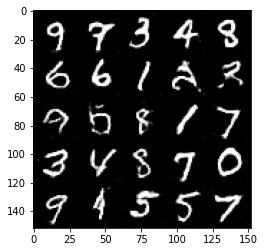

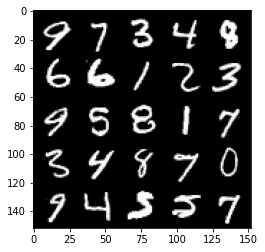

Loss Generator: 0.7466 / Loss Discriminator 0.6807: 100%|██████████| 469/469 [00:14<00:00, 31.76it/s]
Loss Generator: 0.7448 / Loss Discriminator 0.6854:  41%|████      | 192/469 [00:06<00:08, 33.87it/s]

Epochs : 103 , steps : 48500


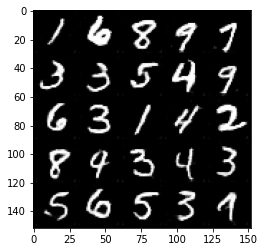

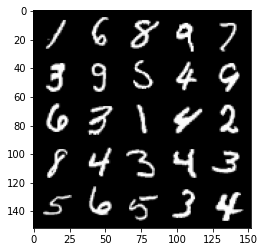

Loss Generator: 0.7415 / Loss Discriminator 0.6857: 100%|██████████| 469/469 [00:14<00:00, 31.72it/s]
Loss Generator: 0.7482 / Loss Discriminator 0.6831:  48%|████▊     | 223/469 [00:07<00:08, 27.60it/s]

Epochs : 104 , steps : 49000


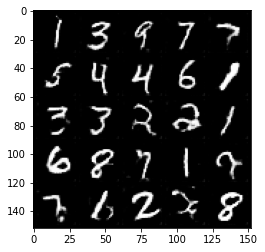

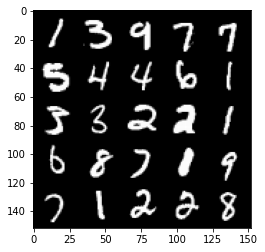

Loss Generator: 0.7492 / Loss Discriminator 0.6823: 100%|██████████| 469/469 [00:15<00:00, 29.79it/s]
Loss Generator: 0.7419 / Loss Discriminator 0.6869:  54%|█████▎    | 251/469 [00:07<00:06, 32.73it/s]

Epochs : 105 , steps : 49500


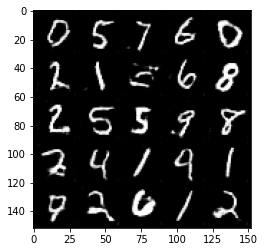

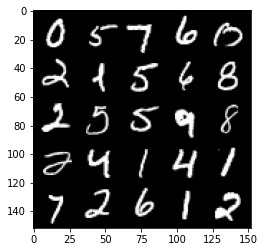

Loss Generator: 0.7428 / Loss Discriminator 0.6861: 100%|██████████| 469/469 [00:14<00:00, 31.32it/s]
Loss Generator: 0.7446 / Loss Discriminator 0.6856:  60%|██████    | 283/469 [00:09<00:06, 30.67it/s]

Epochs : 106 , steps : 50000


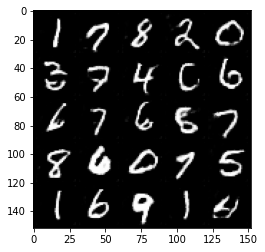

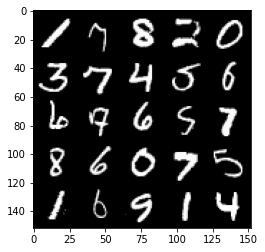

Loss Generator: 0.7416 / Loss Discriminator 0.6856: 100%|██████████| 469/469 [00:15<00:00, 30.35it/s]
Loss Generator: 0.7418 / Loss Discriminator 0.6866:  67%|██████▋   | 313/469 [00:10<00:04, 32.09it/s]

Epochs : 107 , steps : 50500


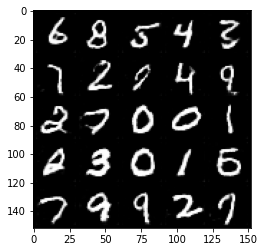

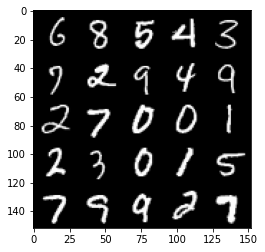

Loss Generator: 0.7415 / Loss Discriminator 0.6865: 100%|██████████| 469/469 [00:15<00:00, 30.78it/s]
Loss Generator: 0.7419 / Loss Discriminator 0.6881:  73%|███████▎  | 344/469 [00:11<00:04, 29.06it/s]

Epochs : 108 , steps : 51000


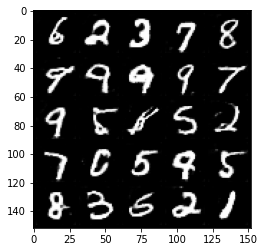

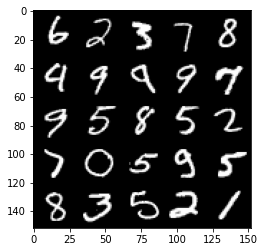

Loss Generator: 0.7451 / Loss Discriminator 0.685: 100%|██████████| 469/469 [00:15<00:00, 30.87it/s]
Loss Generator: 0.741 / Loss Discriminator 0.6837:  81%|████████  | 378/469 [00:11<00:02, 31.88it/s]

Epochs : 109 , steps : 51500


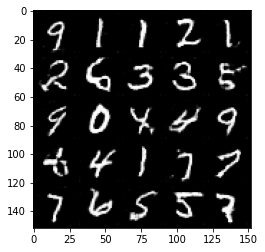

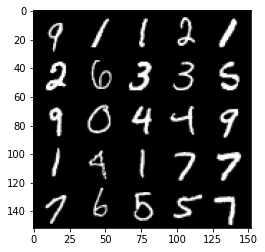

Loss Generator: 0.7402 / Loss Discriminator 0.6841: 100%|██████████| 469/469 [00:14<00:00, 31.50it/s]
Loss Generator: 0.7387 / Loss Discriminator 0.6833:  87%|████████▋ | 407/469 [00:12<00:01, 32.90it/s]

Epochs : 110 , steps : 52000


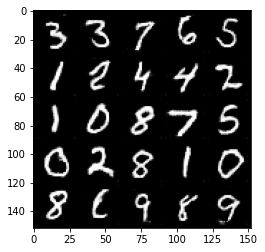

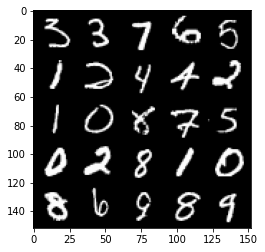

Loss Generator: 0.7364 / Loss Discriminator 0.6843: 100%|██████████| 469/469 [00:15<00:00, 31.24it/s]
Loss Generator: 0.7411 / Loss Discriminator 0.6839:  94%|█████████▍| 440/469 [00:13<00:00, 33.36it/s]

Epochs : 111 , steps : 52500


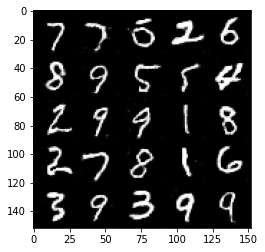

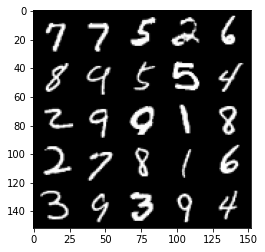

Loss Generator: 0.7415 / Loss Discriminator 0.6838: 100%|██████████| 469/469 [00:14<00:00, 31.73it/s]
Loss Generator: 0.7465 / Loss Discriminator 0.6835: 100%|██████████| 469/469 [00:14<00:00, 31.33it/s]
Loss Generator: 0.7404 / Loss Discriminator 0.6557:   0%|          | 0/469 [00:00<?, ?it/s]

Epochs : 113 , steps : 53000


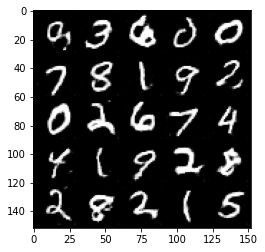

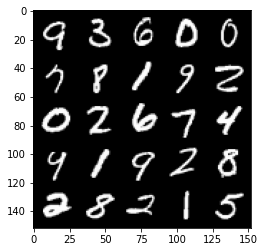

Loss Generator: 0.7397 / Loss Discriminator 0.6861: 100%|██████████| 469/469 [00:15<00:00, 31.03it/s]
Loss Generator: 0.734 / Loss Discriminator 0.6774:   7%|▋         | 33/469 [00:01<00:13, 31.19it/s]

Epochs : 114 , steps : 53500


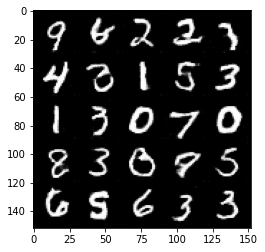

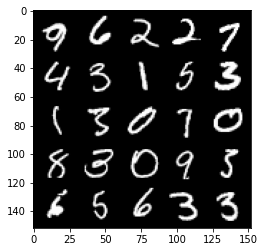

Loss Generator: 0.7317 / Loss Discriminator 0.6868: 100%|██████████| 469/469 [00:15<00:00, 30.76it/s]
Loss Generator: 0.7558 / Loss Discriminator 0.6703:  13%|█▎        | 63/469 [00:02<00:12, 31.73it/s]

Epochs : 115 , steps : 54000


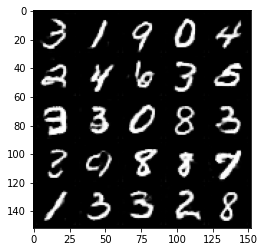

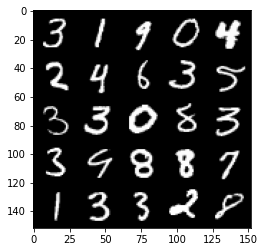

Loss Generator: 0.7398 / Loss Discriminator 0.6828: 100%|██████████| 469/469 [00:15<00:00, 30.41it/s]
Loss Generator: 0.737 / Loss Discriminator 0.6897:  20%|█▉        | 92/469 [00:02<00:11, 33.58it/s]

Epochs : 116 , steps : 54500


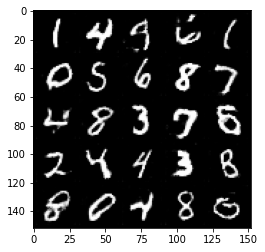

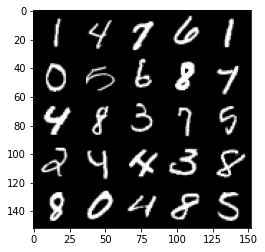

Loss Generator: 0.7406 / Loss Discriminator 0.6827: 100%|██████████| 469/469 [00:15<00:00, 31.20it/s]
Loss Generator: 0.7308 / Loss Discriminator 0.6858:  27%|██▋       | 125/469 [00:03<00:10, 33.84it/s]

Epochs : 117 , steps : 55000


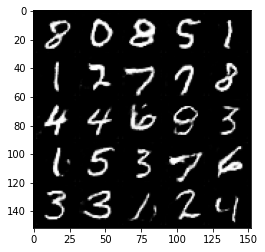

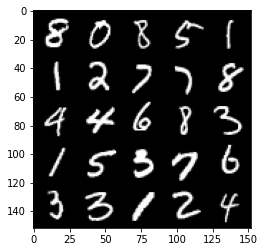

Loss Generator: 0.7319 / Loss Discriminator 0.6861: 100%|██████████| 469/469 [00:15<00:00, 31.07it/s]
Loss Generator: 0.7379 / Loss Discriminator 0.6829:  33%|███▎      | 154/469 [00:05<00:10, 29.07it/s]

Epochs : 118 , steps : 55500


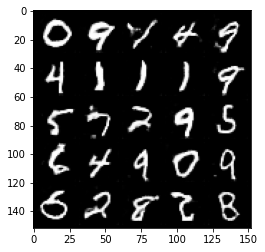

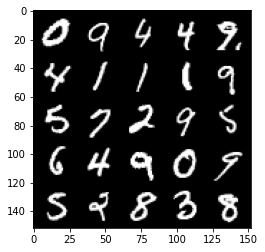

Loss Generator: 0.7378 / Loss Discriminator 0.6845: 100%|██████████| 469/469 [00:15<00:00, 30.62it/s]
Loss Generator: 0.7389 / Loss Discriminator 0.6815:  40%|████      | 188/469 [00:06<00:08, 32.74it/s]

Epochs : 119 , steps : 56000


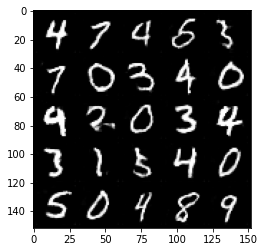

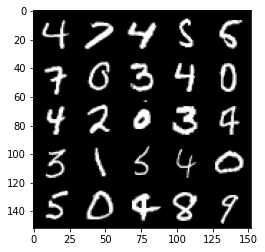

Loss Generator: 0.739 / Loss Discriminator 0.6834: 100%|██████████| 469/469 [00:15<00:00, 31.11it/s]
Loss Generator: 0.7358 / Loss Discriminator 0.6861:  47%|████▋     | 219/469 [00:06<00:09, 27.27it/s]

Epochs : 120 , steps : 56500


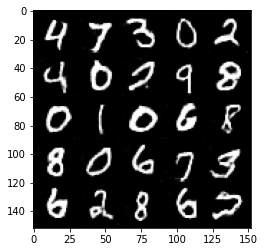

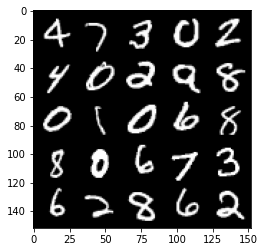

Loss Generator: 0.7368 / Loss Discriminator 0.6851: 100%|██████████| 469/469 [00:15<00:00, 30.67it/s]
Loss Generator: 0.7318 / Loss Discriminator 0.6845:  53%|█████▎    | 250/469 [00:07<00:06, 31.58it/s]

Epochs : 121 , steps : 57000


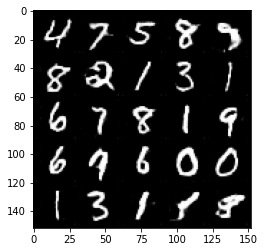

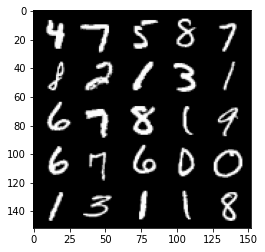

Loss Generator: 0.7337 / Loss Discriminator 0.6855: 100%|██████████| 469/469 [00:15<00:00, 30.85it/s]
Loss Generator: 0.7374 / Loss Discriminator 0.6832:  60%|█████▉    | 281/469 [00:08<00:05, 32.23it/s]

Epochs : 122 , steps : 57500


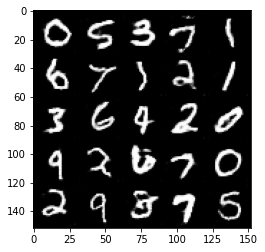

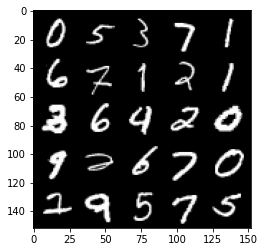

Loss Generator: 0.7396 / Loss Discriminator 0.6834: 100%|██████████| 469/469 [00:15<00:00, 31.20it/s]
Loss Generator: 0.741 / Loss Discriminator 0.6824:  66%|██████▌   | 310/469 [00:09<00:04, 33.44it/s]

Epochs : 123 , steps : 58000


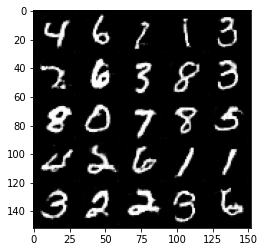

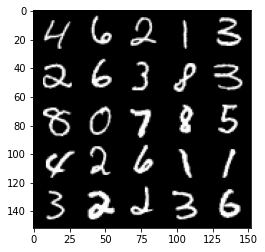

Loss Generator: 0.7429 / Loss Discriminator 0.682: 100%|██████████| 469/469 [00:14<00:00, 31.73it/s]
Loss Generator: 0.7441 / Loss Discriminator 0.6836:  73%|███████▎  | 341/469 [00:10<00:04, 29.93it/s]

Epochs : 124 , steps : 58500


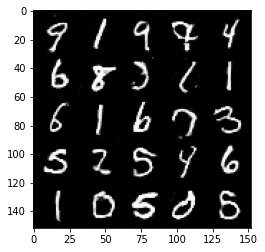

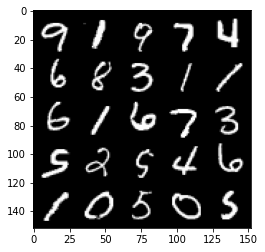

Loss Generator: 0.7456 / Loss Discriminator 0.6835: 100%|██████████| 469/469 [00:14<00:00, 31.79it/s]
Loss Generator: 0.7344 / Loss Discriminator 0.6824:  79%|███████▉  | 372/469 [00:12<00:03, 28.68it/s]

Epochs : 125 , steps : 59000


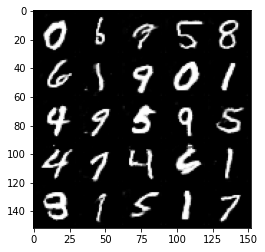

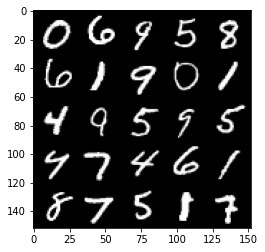

Loss Generator: 0.7324 / Loss Discriminator 0.6837: 100%|██████████| 469/469 [00:15<00:00, 29.87it/s]
Loss Generator: 0.7357 / Loss Discriminator 0.6831:  86%|████████▋ | 405/469 [00:12<00:01, 33.75it/s]

Epochs : 126 , steps : 59500


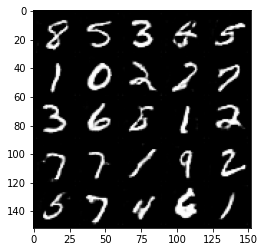

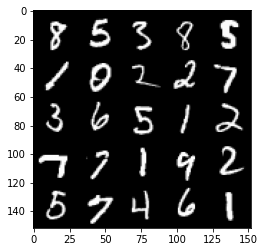

Loss Generator: 0.7354 / Loss Discriminator 0.683: 100%|██████████| 469/469 [00:14<00:00, 31.53it/s]
Loss Generator: 0.7404 / Loss Discriminator 0.6822:  93%|█████████▎| 435/469 [00:13<00:01, 33.33it/s]

Epochs : 127 , steps : 60000


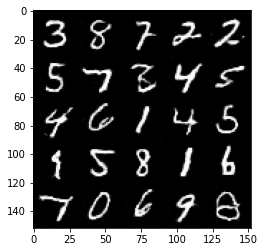

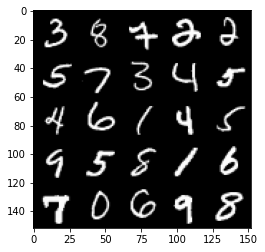

Loss Generator: 0.7397 / Loss Discriminator 0.6819: 100%|██████████| 469/469 [00:14<00:00, 31.76it/s]
Loss Generator: 0.741 / Loss Discriminator 0.6818:  99%|█████████▉| 464/469 [00:14<00:00, 33.27it/s]

Epochs : 128 , steps : 60500


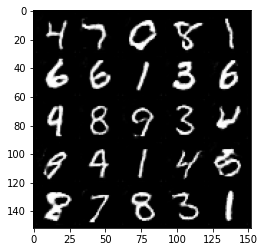

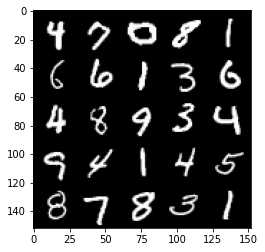

Loss Generator: 0.7409 / Loss Discriminator 0.6819: 100%|██████████| 469/469 [00:15<00:00, 30.85it/s]
Loss Generator: 0.7397 / Loss Discriminator 0.6829: 100%|██████████| 469/469 [00:14<00:00, 32.06it/s]
Loss Generator: 0.7269 / Loss Discriminator 0.6956:   6%|▌         | 28/469 [00:00<00:13, 33.52it/s]

Epochs : 130 , steps : 61000


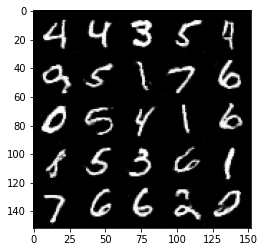

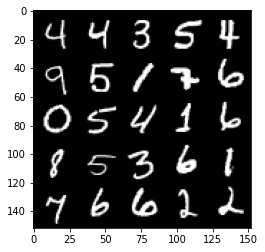

Loss Generator: 0.739 / Loss Discriminator 0.681: 100%|██████████| 469/469 [00:14<00:00, 32.20it/s]
Loss Generator: 0.7511 / Loss Discriminator 0.6803:  13%|█▎        | 60/469 [00:01<00:12, 33.82it/s]

Epochs : 131 , steps : 61500


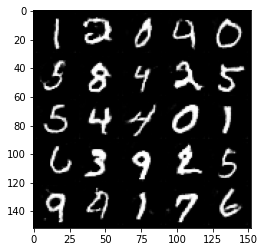

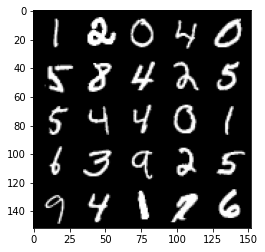

Loss Generator: 0.7445 / Loss Discriminator 0.6787: 100%|██████████| 469/469 [00:14<00:00, 32.05it/s]
Loss Generator: 0.7393 / Loss Discriminator 0.6829:  19%|█▉        | 91/469 [00:02<00:11, 33.36it/s]

Epochs : 132 , steps : 62000


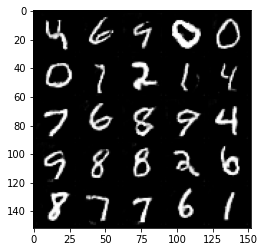

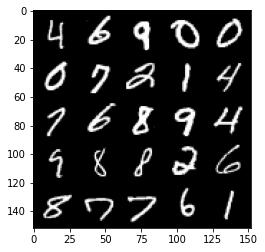

Loss Generator: 0.7359 / Loss Discriminator 0.6833: 100%|██████████| 469/469 [00:15<00:00, 31.20it/s]
Loss Generator: 0.7324 / Loss Discriminator 0.6839:  26%|██▌       | 122/469 [00:03<00:11, 29.98it/s]

Epochs : 133 , steps : 62500


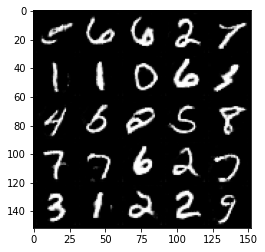

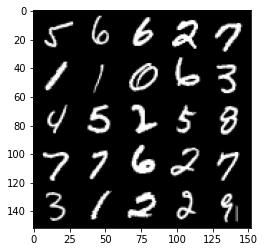

Loss Generator: 0.7366 / Loss Discriminator 0.683: 100%|██████████| 469/469 [00:15<00:00, 30.28it/s]
Loss Generator: 0.7483 / Loss Discriminator 0.6806:  32%|███▏      | 150/469 [00:04<00:10, 30.16it/s]

Epochs : 134 , steps : 63000


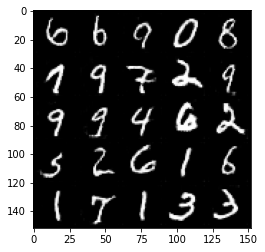

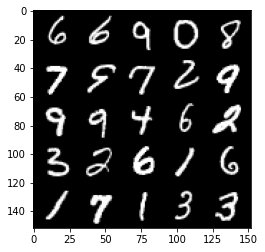

Loss Generator: 0.7416 / Loss Discriminator 0.6799: 100%|██████████| 469/469 [00:15<00:00, 31.02it/s]
Loss Generator: 0.7466 / Loss Discriminator 0.6809:  39%|███▉      | 184/469 [00:06<00:09, 31.14it/s]

Epochs : 135 , steps : 63500


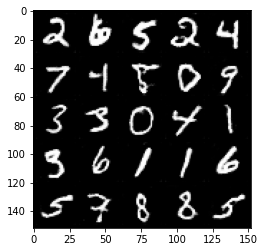

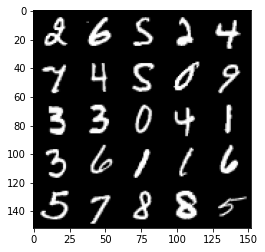

Loss Generator: 0.7422 / Loss Discriminator 0.6833: 100%|██████████| 469/469 [00:15<00:00, 30.40it/s]
Loss Generator: 0.7462 / Loss Discriminator 0.6762:  45%|████▌     | 212/469 [00:06<00:07, 33.32it/s]

Epochs : 136 , steps : 64000


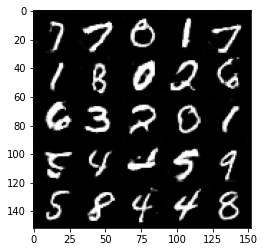

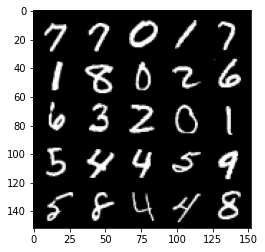

Loss Generator: 0.7392 / Loss Discriminator 0.6792: 100%|██████████| 469/469 [00:14<00:00, 32.06it/s]
Loss Generator: 0.7362 / Loss Discriminator 0.6837:  52%|█████▏    | 244/469 [00:07<00:06, 33.31it/s]

Epochs : 137 , steps : 64500


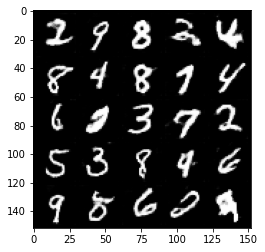

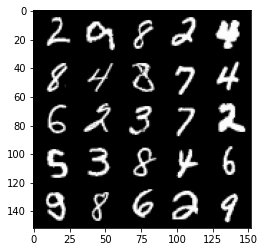

Loss Generator: 0.7369 / Loss Discriminator 0.6812: 100%|██████████| 469/469 [00:14<00:00, 32.28it/s]
Loss Generator: 0.7446 / Loss Discriminator 0.6813:  58%|█████▊    | 274/469 [00:08<00:05, 32.99it/s]

Epochs : 138 , steps : 65000


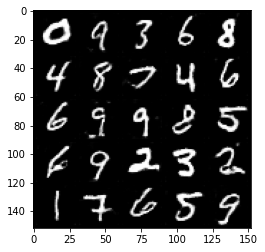

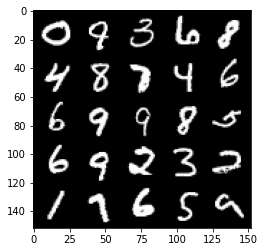

Loss Generator: 0.7402 / Loss Discriminator 0.6819: 100%|██████████| 469/469 [00:14<00:00, 31.28it/s]
Loss Generator: 0.7454 / Loss Discriminator 0.6816:  65%|██████▌   | 306/469 [00:09<00:05, 30.59it/s]

Epochs : 139 , steps : 65500


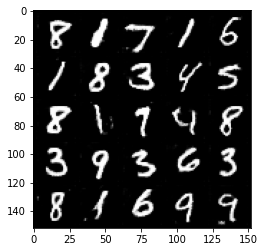

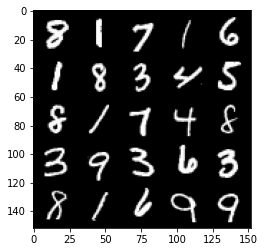

Loss Generator: 0.744 / Loss Discriminator 0.6813: 100%|██████████| 469/469 [00:15<00:00, 30.51it/s]
Loss Generator: 0.7489 / Loss Discriminator 0.6793:  72%|███████▏  | 338/469 [00:10<00:03, 32.81it/s]

Epochs : 140 , steps : 66000


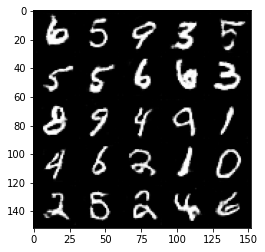

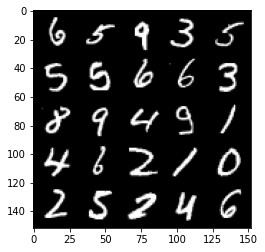

Loss Generator: 0.7477 / Loss Discriminator 0.6785: 100%|██████████| 469/469 [00:15<00:00, 30.70it/s]
Loss Generator: 0.7371 / Loss Discriminator 0.6817:  79%|███████▉  | 370/469 [00:11<00:03, 30.58it/s]

Epochs : 141 , steps : 66500


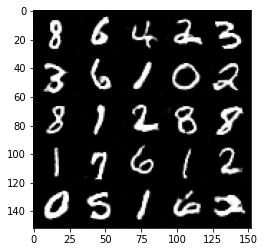

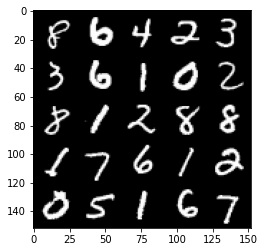

Loss Generator: 0.735 / Loss Discriminator 0.683: 100%|██████████| 469/469 [00:15<00:00, 31.21it/s]
Loss Generator: 0.7342 / Loss Discriminator 0.6822:  85%|████████▌ | 400/469 [00:12<00:02, 33.13it/s]

Epochs : 142 , steps : 67000


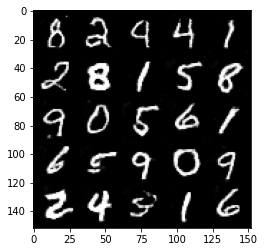

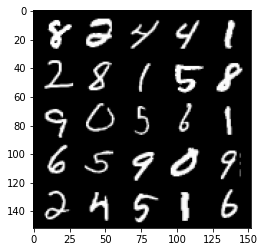

Loss Generator: 0.7368 / Loss Discriminator 0.6799: 100%|██████████| 469/469 [00:14<00:00, 32.03it/s]
Loss Generator: 0.7338 / Loss Discriminator 0.6826:  92%|█████████▏| 430/469 [00:13<00:01, 31.84it/s]

Epochs : 143 , steps : 67500


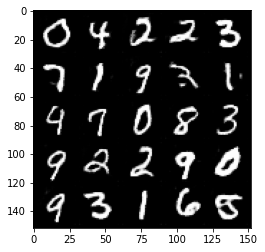

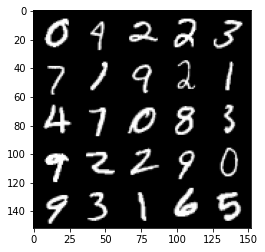

Loss Generator: 0.7349 / Loss Discriminator 0.6822: 100%|██████████| 469/469 [00:14<00:00, 32.07it/s]
Loss Generator: 0.7348 / Loss Discriminator 0.6811:  98%|█████████▊| 460/469 [00:14<00:00, 31.34it/s]

Epochs : 144 , steps : 68000


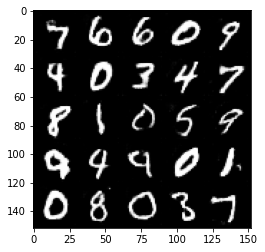

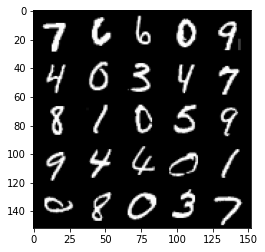

Loss Generator: 0.735 / Loss Discriminator 0.6811: 100%|██████████| 469/469 [00:14<00:00, 31.31it/s]
Loss Generator: 0.7391 / Loss Discriminator 0.6812: 100%|██████████| 469/469 [00:15<00:00, 30.78it/s]
Loss Generator: 0.7231 / Loss Discriminator 0.7008:   5%|▍         | 23/469 [00:00<00:13, 32.08it/s]

Epochs : 146 , steps : 68500


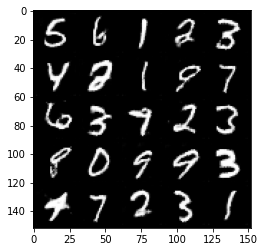

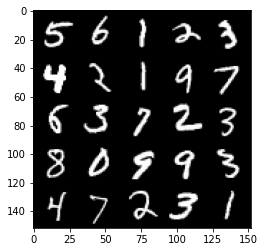

Loss Generator: 0.7446 / Loss Discriminator 0.6796: 100%|██████████| 469/469 [00:15<00:00, 30.10it/s]
Loss Generator: 0.7616 / Loss Discriminator 0.6728:  12%|█▏        | 55/469 [00:01<00:14, 28.69it/s]

Epochs : 147 , steps : 69000


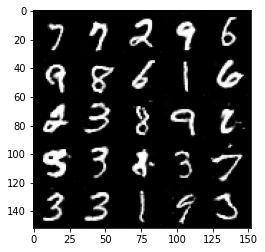

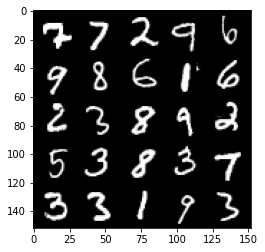

Loss Generator: 0.7404 / Loss Discriminator 0.6806: 100%|██████████| 469/469 [00:15<00:00, 30.92it/s]
Loss Generator: 0.7545 / Loss Discriminator 0.6687:  18%|█▊        | 86/469 [00:02<00:13, 28.57it/s]

Epochs : 148 , steps : 69500


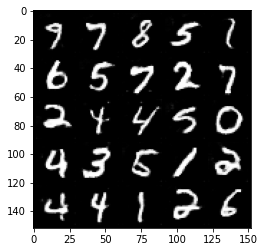

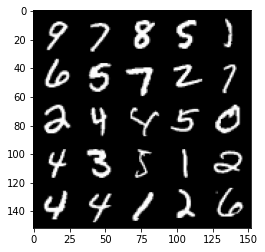

Loss Generator: 0.739 / Loss Discriminator 0.6784: 100%|██████████| 469/469 [00:14<00:00, 32.06it/s]
Loss Generator: 0.7384 / Loss Discriminator 0.6849:  25%|██▍       | 115/469 [00:03<00:10, 33.38it/s]

Epochs : 149 , steps : 70000


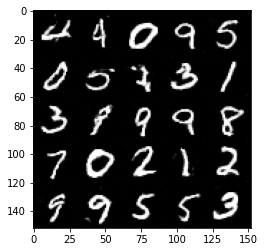

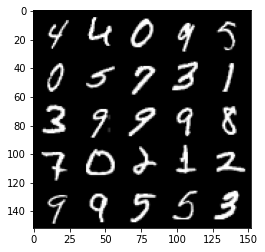

Loss Generator: 0.7424 / Loss Discriminator 0.6808: 100%|██████████| 469/469 [00:15<00:00, 31.04it/s]
Loss Generator: 0.7472 / Loss Discriminator 0.6731:  31%|███▏      | 147/469 [00:04<00:09, 33.13it/s]

Epochs : 150 , steps : 70500


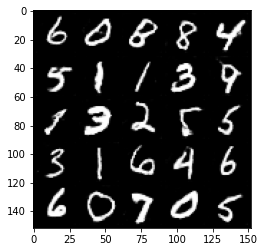

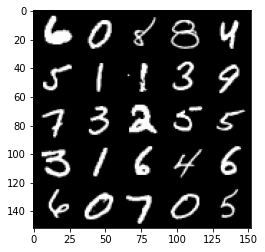

Loss Generator: 0.7413 / Loss Discriminator 0.679: 100%|██████████| 469/469 [00:15<00:00, 29.73it/s]
Loss Generator: 0.7404 / Loss Discriminator 0.6796:  38%|███▊      | 179/469 [00:05<00:09, 29.40it/s]

Epochs : 151 , steps : 71000


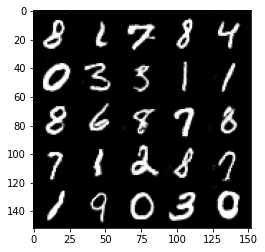

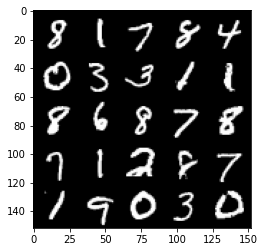

Loss Generator: 0.7429 / Loss Discriminator 0.6787: 100%|██████████| 469/469 [00:15<00:00, 29.96it/s]
Loss Generator: 0.733 / Loss Discriminator 0.6824:  45%|████▍     | 211/469 [00:06<00:08, 30.04it/s]

Epochs : 152 , steps : 71500


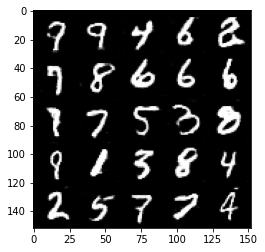

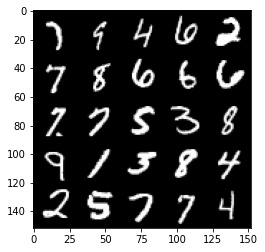

Loss Generator: 0.7401 / Loss Discriminator 0.6796: 100%|██████████| 469/469 [00:16<00:00, 29.31it/s]
Loss Generator: 0.7405 / Loss Discriminator 0.6799:  51%|█████     | 240/469 [00:08<00:08, 27.81it/s]

Epochs : 153 , steps : 72000


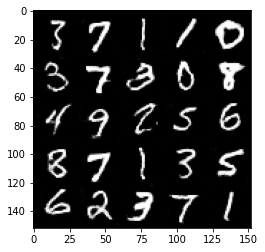

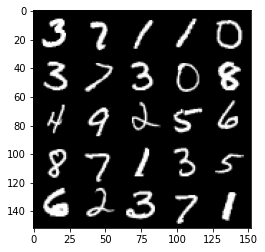

Loss Generator: 0.7405 / Loss Discriminator 0.6794: 100%|██████████| 469/469 [00:16<00:00, 28.52it/s]
Loss Generator: 0.7501 / Loss Discriminator 0.6789:  58%|█████▊    | 272/469 [00:09<00:06, 28.15it/s]

Epochs : 154 , steps : 72500


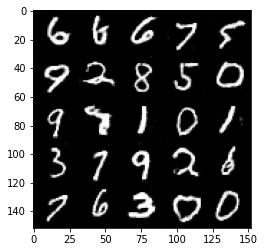

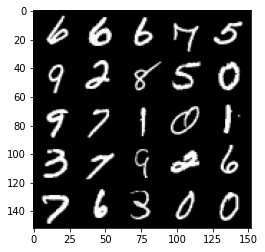

Loss Generator: 0.7504 / Loss Discriminator 0.6761: 100%|██████████| 469/469 [00:15<00:00, 29.55it/s]
Loss Generator: 0.7487 / Loss Discriminator 0.6775:  64%|██████▍   | 302/469 [00:09<00:05, 29.99it/s]

Epochs : 155 , steps : 73000


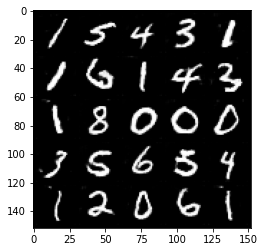

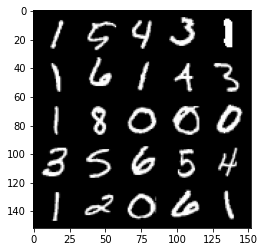

Loss Generator: 0.7487 / Loss Discriminator 0.6769: 100%|██████████| 469/469 [00:15<00:00, 30.19it/s]
Loss Generator: 0.7421 / Loss Discriminator 0.6798:  71%|███████   | 332/469 [00:11<00:04, 29.89it/s]

Epochs : 156 , steps : 73500


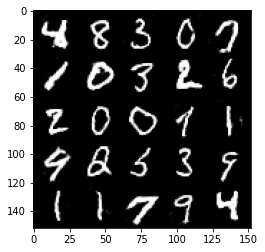

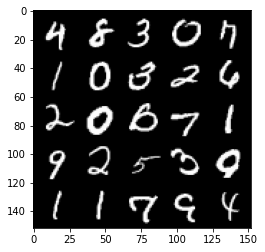

Loss Generator: 0.7419 / Loss Discriminator 0.6792: 100%|██████████| 469/469 [00:16<00:00, 29.26it/s]
Loss Generator: 0.7468 / Loss Discriminator 0.6781:  78%|███████▊  | 366/469 [00:11<00:03, 31.75it/s]

Epochs : 157 , steps : 74000


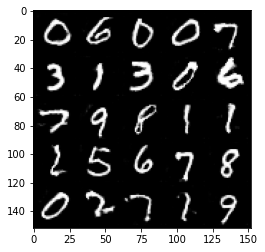

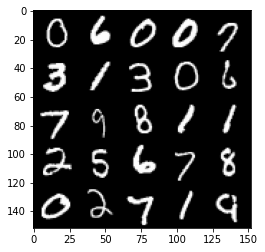

Loss Generator: 0.7477 / Loss Discriminator 0.6776: 100%|██████████| 469/469 [00:15<00:00, 30.15it/s]
Loss Generator: 0.7443 / Loss Discriminator 0.679:  85%|████████▍ | 397/469 [00:13<00:02, 27.13it/s]

Epochs : 158 , steps : 74500


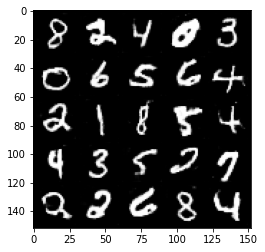

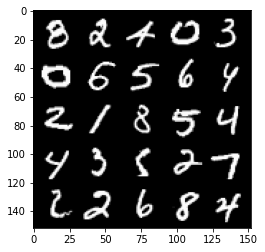

Loss Generator: 0.7445 / Loss Discriminator 0.6789: 100%|██████████| 469/469 [00:15<00:00, 29.46it/s]
Loss Generator: 0.7525 / Loss Discriminator 0.6763:  91%|█████████ | 427/469 [00:14<00:01, 29.56it/s]

Epochs : 159 , steps : 75000


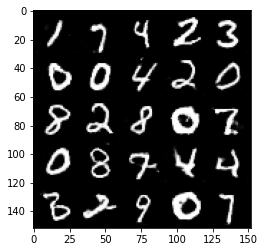

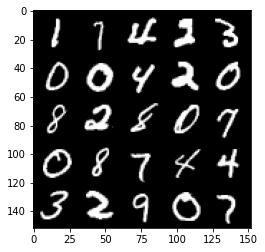

Loss Generator: 0.7519 / Loss Discriminator 0.6766: 100%|██████████| 469/469 [00:15<00:00, 29.33it/s]
Loss Generator: 0.7461 / Loss Discriminator 0.6756:  97%|█████████▋| 456/469 [00:14<00:00, 30.43it/s]

Epochs : 160 , steps : 75500


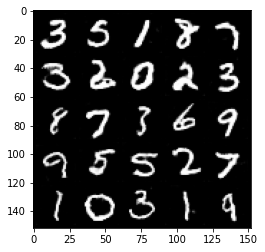

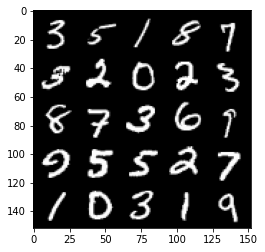

Loss Generator: 0.7451 / Loss Discriminator 0.6761: 100%|██████████| 469/469 [00:15<00:00, 30.44it/s]
Loss Generator: 0.7414 / Loss Discriminator 0.6784: 100%|██████████| 469/469 [00:15<00:00, 31.26it/s]
Loss Generator: 0.7659 / Loss Discriminator 0.6679:   4%|▍         | 20/469 [00:00<00:15, 28.50it/s]

Epochs : 162 , steps : 76000


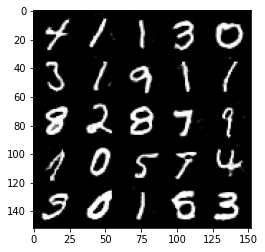

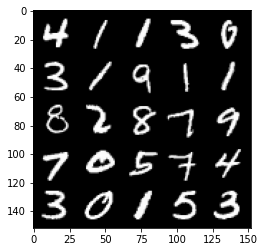

Loss Generator: 0.7439 / Loss Discriminator 0.677: 100%|██████████| 469/469 [00:15<00:00, 29.70it/s]
Loss Generator: 0.7475 / Loss Discriminator 0.6838:  11%|█         | 52/469 [00:01<00:14, 28.02it/s]

Epochs : 163 , steps : 76500


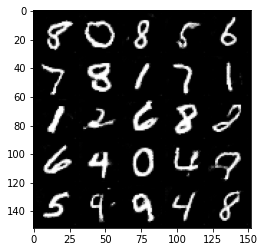

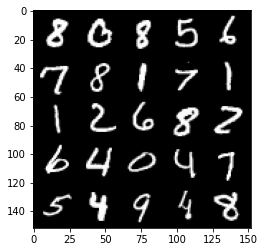

Loss Generator: 0.7428 / Loss Discriminator 0.6765: 100%|██████████| 469/469 [00:16<00:00, 28.39it/s]
Loss Generator: 0.7402 / Loss Discriminator 0.6817:  18%|█▊        | 83/469 [00:02<00:12, 31.49it/s]

Epochs : 164 , steps : 77000


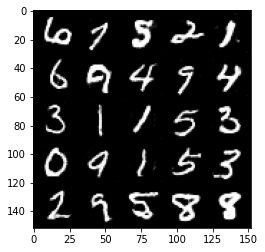

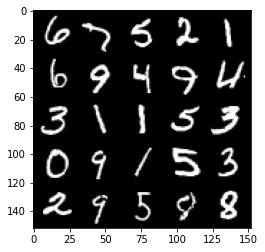

Loss Generator: 0.7473 / Loss Discriminator 0.6771: 100%|██████████| 469/469 [00:15<00:00, 30.51it/s]
Loss Generator: 0.7469 / Loss Discriminator 0.6768:  24%|██▍       | 113/469 [00:03<00:11, 31.13it/s]

Epochs : 165 , steps : 77500


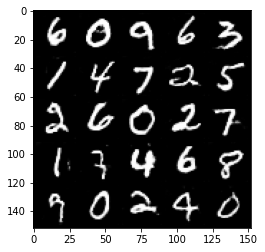

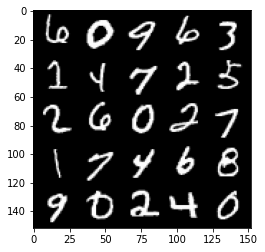

Loss Generator: 0.7424 / Loss Discriminator 0.6789: 100%|██████████| 469/469 [00:15<00:00, 29.59it/s]
Loss Generator: 0.7397 / Loss Discriminator 0.6796:  31%|███       | 145/469 [00:04<00:10, 31.95it/s]

Epochs : 166 , steps : 78000


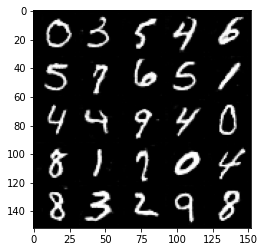

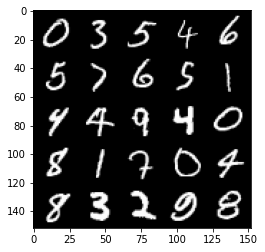

Loss Generator: 0.7511 / Loss Discriminator 0.6764: 100%|██████████| 469/469 [00:15<00:00, 30.17it/s]
Loss Generator: 0.7497 / Loss Discriminator 0.6758:  37%|███▋      | 175/469 [00:05<00:09, 31.94it/s]

Epochs : 167 , steps : 78500


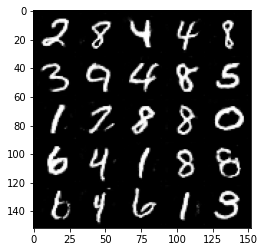

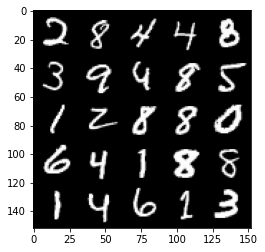

Loss Generator: 0.7496 / Loss Discriminator 0.6765: 100%|██████████| 469/469 [00:15<00:00, 30.42it/s]
Loss Generator: 0.7498 / Loss Discriminator 0.6738:  43%|████▎     | 204/469 [00:06<00:08, 31.60it/s]

Epochs : 168 , steps : 79000


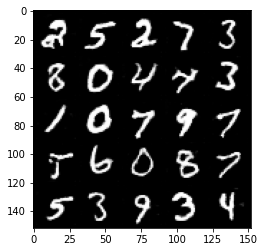

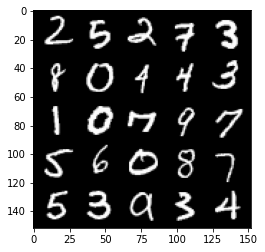

Loss Generator: 0.7501 / Loss Discriminator 0.6773: 100%|██████████| 469/469 [00:15<00:00, 29.98it/s]
Loss Generator: 0.7496 / Loss Discriminator 0.6756:  50%|█████     | 236/469 [00:07<00:08, 28.76it/s]

Epochs : 169 , steps : 79500


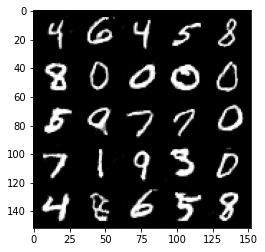

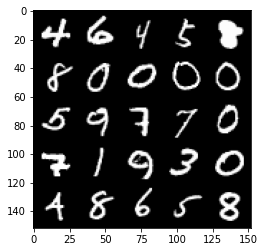

Loss Generator: 0.746 / Loss Discriminator 0.6779: 100%|██████████| 469/469 [00:15<00:00, 29.77it/s]
Loss Generator: 0.7441 / Loss Discriminator 0.6772:  57%|█████▋    | 267/469 [00:08<00:06, 29.01it/s]

Epochs : 170 , steps : 80000


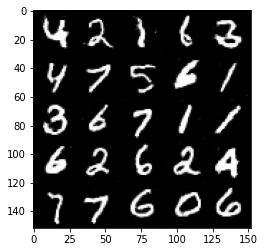

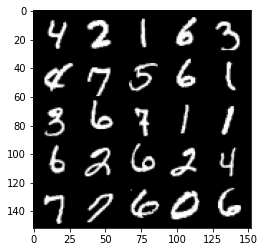

Loss Generator: 0.7444 / Loss Discriminator 0.6778: 100%|██████████| 469/469 [00:15<00:00, 30.15it/s]
Loss Generator: 0.7479 / Loss Discriminator 0.6757:  64%|██████▍   | 299/469 [00:09<00:05, 31.41it/s]

Epochs : 171 , steps : 80500


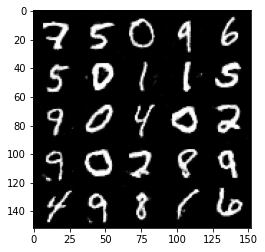

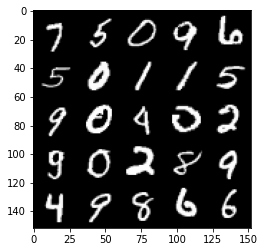

Loss Generator: 0.7503 / Loss Discriminator 0.6748: 100%|██████████| 469/469 [00:15<00:00, 29.71it/s]
Loss Generator: 0.7486 / Loss Discriminator 0.6755:  70%|██████▉   | 328/469 [00:10<00:04, 31.18it/s]

Epochs : 172 , steps : 81000


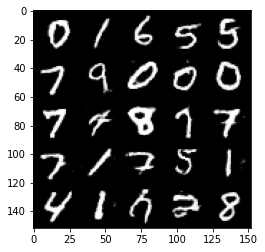

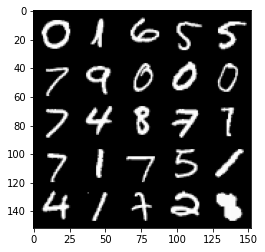

Loss Generator: 0.7466 / Loss Discriminator 0.6772: 100%|██████████| 469/469 [00:15<00:00, 30.01it/s]
Loss Generator: 0.7418 / Loss Discriminator 0.678:  77%|███████▋  | 361/469 [00:11<00:03, 31.43it/s]

Epochs : 173 , steps : 81500


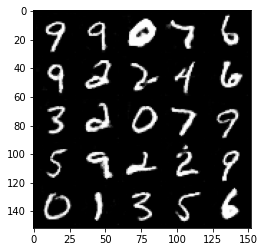

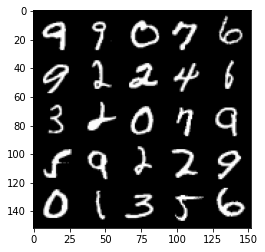

Loss Generator: 0.7438 / Loss Discriminator 0.6766: 100%|██████████| 469/469 [00:15<00:00, 30.16it/s]
Loss Generator: 0.7416 / Loss Discriminator 0.6794:  83%|████████▎ | 391/469 [00:12<00:02, 33.01it/s]

Epochs : 174 , steps : 82000


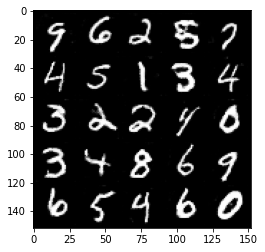

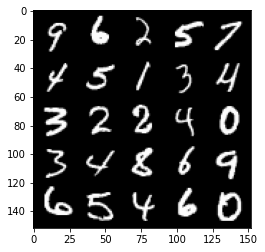

Loss Generator: 0.7435 / Loss Discriminator 0.6775: 100%|██████████| 469/469 [00:15<00:00, 31.23it/s]
Loss Generator: 0.7437 / Loss Discriminator 0.6769:  90%|████████▉ | 422/469 [00:13<00:01, 31.48it/s]

Epochs : 175 , steps : 82500


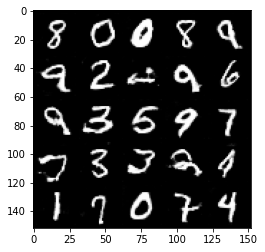

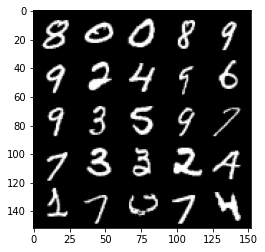

Loss Generator: 0.742 / Loss Discriminator 0.6782: 100%|██████████| 469/469 [00:15<00:00, 30.40it/s]
Loss Generator: 0.7427 / Loss Discriminator 0.6764:  97%|█████████▋| 453/469 [00:14<00:00, 27.24it/s]

Epochs : 176 , steps : 83000


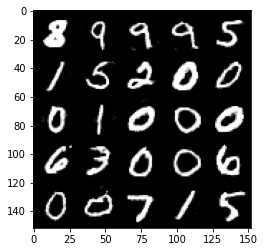

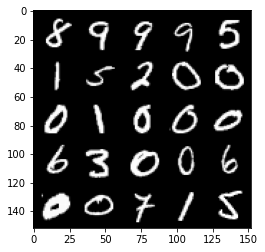

Loss Generator: 0.7427 / Loss Discriminator 0.6765: 100%|██████████| 469/469 [00:15<00:00, 30.02it/s]
Loss Generator: 0.7479 / Loss Discriminator 0.679: 100%|██████████| 469/469 [00:15<00:00, 31.18it/s]
Loss Generator: 0.7359 / Loss Discriminator 0.6793:   3%|▎         | 16/469 [00:00<00:13, 32.96it/s]

Epochs : 178 , steps : 83500


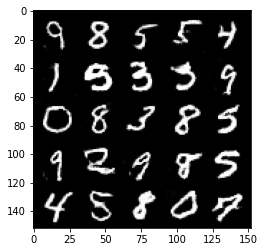

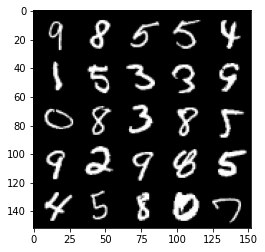

Loss Generator: 0.7456 / Loss Discriminator 0.6751: 100%|██████████| 469/469 [00:16<00:00, 29.18it/s]
Loss Generator: 0.7367 / Loss Discriminator 0.6839:  10%|▉         | 46/469 [00:01<00:13, 30.50it/s]

Epochs : 179 , steps : 84000


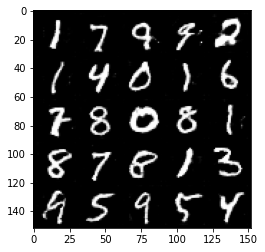

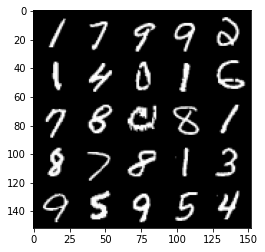

Loss Generator: 0.7502 / Loss Discriminator 0.6745: 100%|██████████| 469/469 [00:16<00:00, 28.96it/s]
Loss Generator: 0.7498 / Loss Discriminator 0.6734:  16%|█▌        | 76/469 [00:02<00:12, 30.54it/s]

Epochs : 180 , steps : 84500


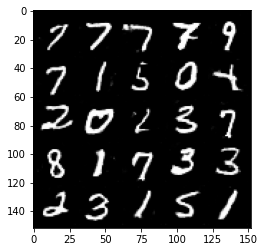

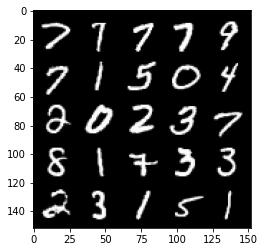

Loss Generator: 0.7498 / Loss Discriminator 0.6749: 100%|██████████| 469/469 [00:15<00:00, 30.33it/s]
Loss Generator: 0.7365 / Loss Discriminator 0.6797:  23%|██▎       | 110/469 [00:03<00:12, 27.97it/s]

Epochs : 181 , steps : 85000


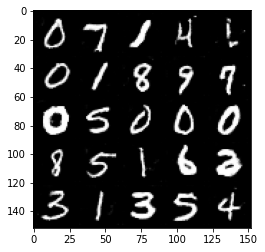

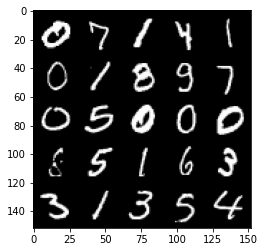

Loss Generator: 0.7462 / Loss Discriminator 0.6772: 100%|██████████| 469/469 [00:15<00:00, 29.86it/s]
Loss Generator: 0.7509 / Loss Discriminator 0.6784:  30%|██▉       | 140/469 [00:04<00:10, 30.07it/s]

Epochs : 182 , steps : 85500


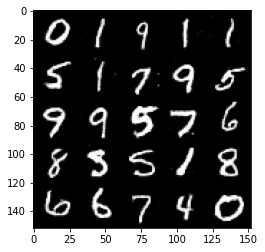

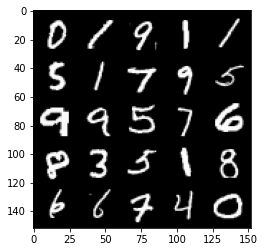

Loss Generator: 0.7504 / Loss Discriminator 0.6765: 100%|██████████| 469/469 [00:16<00:00, 28.90it/s]
Loss Generator: 0.7538 / Loss Discriminator 0.6712:  36%|███▋      | 171/469 [00:05<00:10, 28.19it/s]

Epochs : 183 , steps : 86000


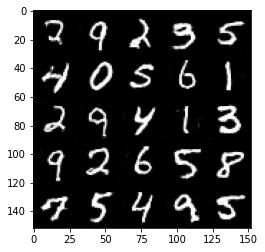

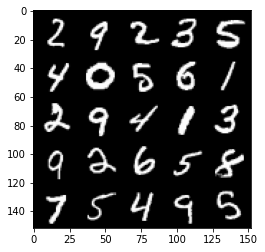

Loss Generator: 0.7501 / Loss Discriminator 0.6735: 100%|██████████| 469/469 [00:16<00:00, 29.03it/s]
Loss Generator: 0.741 / Loss Discriminator 0.6787:  43%|████▎     | 202/469 [00:06<00:08, 31.70it/s]

Epochs : 184 , steps : 86500


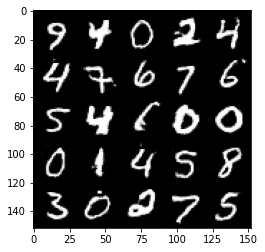

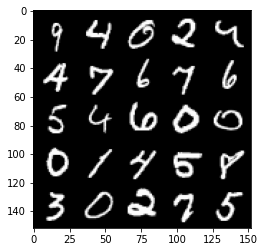

Loss Generator: 0.7449 / Loss Discriminator 0.6783: 100%|██████████| 469/469 [00:15<00:00, 29.48it/s]
Loss Generator: 0.7484 / Loss Discriminator 0.6752:  49%|████▉     | 231/469 [00:07<00:07, 31.71it/s]

Epochs : 185 , steps : 87000


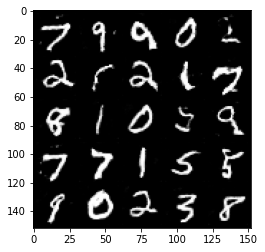

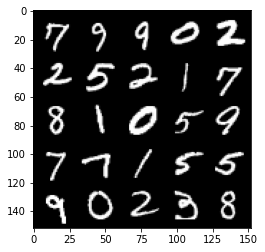

Loss Generator: 0.7502 / Loss Discriminator 0.6746: 100%|██████████| 469/469 [00:15<00:00, 30.21it/s]
Loss Generator: 0.7487 / Loss Discriminator 0.6782:  56%|█████▋    | 264/469 [00:09<00:07, 28.15it/s]

Epochs : 186 , steps : 87500


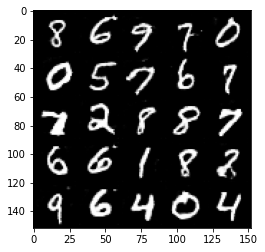

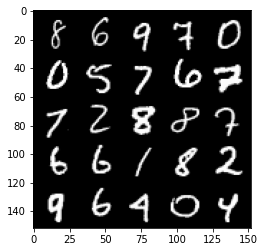

Loss Generator: 0.7505 / Loss Discriminator 0.6755: 100%|██████████| 469/469 [00:16<00:00, 28.89it/s]
Loss Generator: 0.7394 / Loss Discriminator 0.6791:  63%|██████▎   | 296/469 [00:09<00:05, 30.92it/s]

Epochs : 187 , steps : 88000


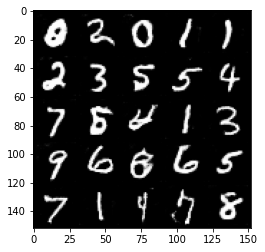

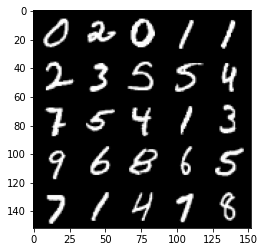

Loss Generator: 0.7398 / Loss Discriminator 0.6802: 100%|██████████| 469/469 [00:15<00:00, 30.02it/s]
Loss Generator: 0.7514 / Loss Discriminator 0.6745:  69%|██████▉   | 325/469 [00:10<00:04, 30.01it/s]

Epochs : 188 , steps : 88500


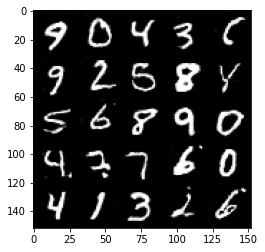

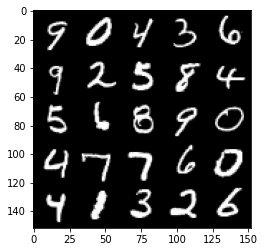

Loss Generator: 0.7504 / Loss Discriminator 0.6745: 100%|██████████| 469/469 [00:15<00:00, 29.40it/s]
Loss Generator: 0.7505 / Loss Discriminator 0.6754:  76%|███████▋  | 358/469 [00:12<00:04, 27.09it/s]

Epochs : 189 , steps : 89000


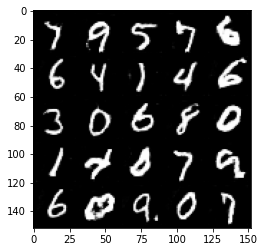

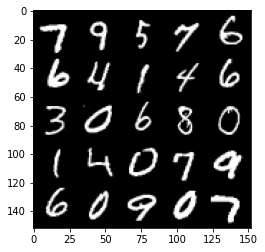

Loss Generator: 0.7513 / Loss Discriminator 0.6746: 100%|██████████| 469/469 [00:16<00:00, 28.98it/s]
Loss Generator: 0.7508 / Loss Discriminator 0.676:  83%|████████▎ | 388/469 [00:13<00:02, 30.84it/s]

Epochs : 190 , steps : 89500


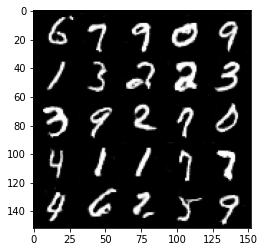

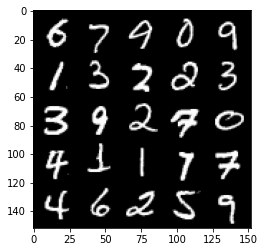

Loss Generator: 0.7511 / Loss Discriminator 0.6757: 100%|██████████| 469/469 [00:16<00:00, 29.17it/s]
Loss Generator: 0.7495 / Loss Discriminator 0.676:  90%|████████▉ | 420/469 [00:13<00:01, 31.57it/s]

Epochs : 191 , steps : 90000


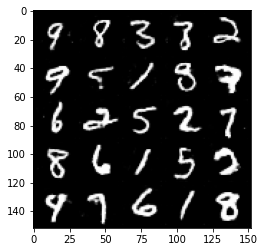

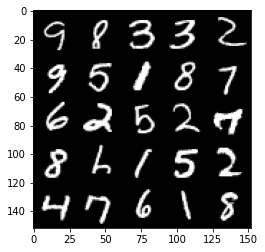

Loss Generator: 0.7495 / Loss Discriminator 0.6763: 100%|██████████| 469/469 [00:15<00:00, 30.19it/s]
Loss Generator: 0.7553 / Loss Discriminator 0.6729:  96%|█████████▌| 448/469 [00:14<00:00, 32.01it/s]

Epochs : 192 , steps : 90500


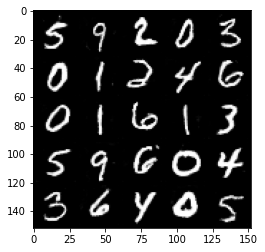

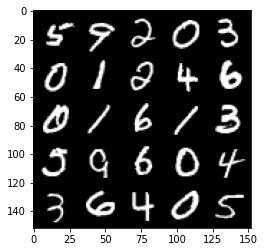

Loss Generator: 0.7528 / Loss Discriminator 0.6745: 100%|██████████| 469/469 [00:15<00:00, 30.29it/s]
Loss Generator: 0.7549 / Loss Discriminator 0.6724: 100%|██████████| 469/469 [00:15<00:00, 29.63it/s]
Loss Generator: 0.7129 / Loss Discriminator 0.6959:   3%|▎         | 13/469 [00:00<00:16, 28.11it/s]

Epochs : 194 , steps : 91000


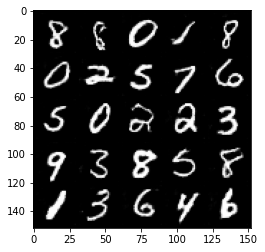

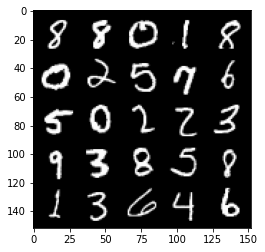

Loss Generator: 0.7501 / Loss Discriminator 0.674: 100%|██████████| 469/469 [00:16<00:00, 29.00it/s]
Loss Generator: 0.7781 / Loss Discriminator 0.6682:   9%|▊         | 41/469 [00:01<00:13, 31.48it/s]

Epochs : 195 , steps : 91500


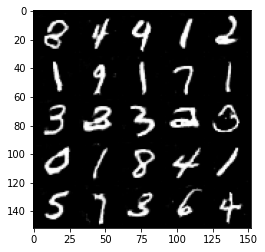

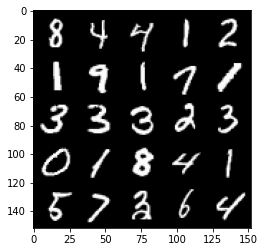

Loss Generator: 0.7524 / Loss Discriminator 0.6751: 100%|██████████| 469/469 [00:15<00:00, 29.79it/s]
Loss Generator: 0.7593 / Loss Discriminator 0.6605:  16%|█▌        | 74/469 [00:02<00:12, 32.91it/s]

Epochs : 196 , steps : 92000


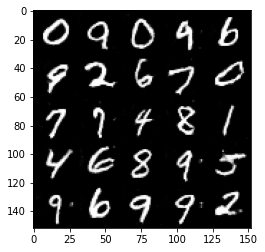

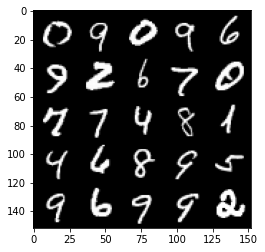

Loss Generator: 0.7558 / Loss Discriminator 0.6723: 100%|██████████| 469/469 [00:15<00:00, 29.91it/s]
Loss Generator: 0.748 / Loss Discriminator 0.6764:  22%|██▏       | 105/469 [00:03<00:11, 31.22it/s]

Epochs : 197 , steps : 92500


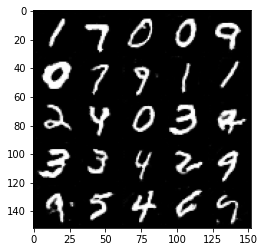

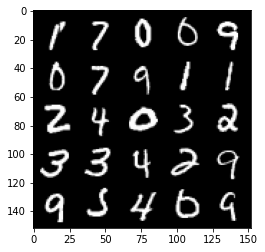

Loss Generator: 0.7511 / Loss Discriminator 0.6727: 100%|██████████| 469/469 [00:15<00:00, 30.18it/s]
Loss Generator: 0.764 / Loss Discriminator 0.6708:  29%|██▉       | 135/469 [00:04<00:11, 29.50it/s]

Epochs : 198 , steps : 93000


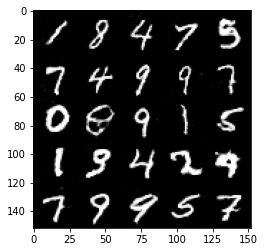

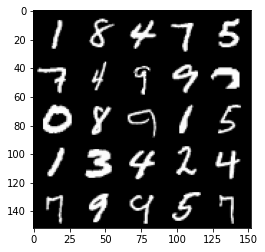

Loss Generator: 0.76 / Loss Discriminator 0.6725: 100%|██████████| 469/469 [00:16<00:00, 27.85it/s]
Loss Generator: 0.7611 / Loss Discriminator 0.6694:  36%|███▌      | 167/469 [00:05<00:10, 29.85it/s]

Epochs : 199 , steps : 93500


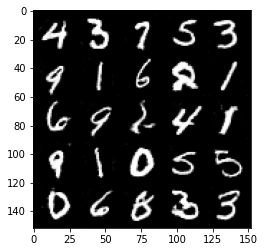

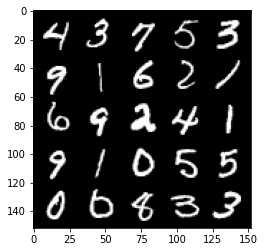

Loss Generator: 0.7587 / Loss Discriminator 0.6716: 100%|██████████| 469/469 [00:15<00:00, 29.54it/s]


In [8]:
history_gen = []
history_disc = []
curr_step = 0
for epoch in range(n_epochs):
    total_gen = 0.
    total_disc = 0.
    t = tqdm(dataloader)
    for idx, (real_img, labels) in enumerate(t):
        curr_step += 1
        # generate fake image
        random_noise = generate_noise_vector(real_img.shape[0], z_dim, device)
        
        # include class into noise vector
        random_noise = noise_vector_cond(random_noise, labels, n_classes)
        #print(random_noise.shape)
        fake_img = gen(random_noise)
        
        # include class into fake image for discriminator
        fake_img_cond = image_cond(fake_img, labels, n_classes)
        
        ## -- update discriminator -- ## 
        disc_optimizer.zero_grad()
        
        # predict real image with discriminator
        real_img_cond = image_cond(real_img, labels, n_classes)
        real_img_cond = real_img_cond.to(device)

        preds_real = disc(real_img_cond)
        real_img = real_img.to("cpu")
        
        # predict fake image with discriminator
        preds_fake = disc(fake_img_cond.detach())
        
        # compute loss function for discriminator
        loss_discriminator_fake = criterion(preds_fake, torch.zeros(preds_fake.shape, device=preds_fake.device))
        loss_discriminator_real = criterion(preds_real, torch.ones(preds_real.shape, device=preds_real.device))
        loss_disc = (loss_discriminator_fake + loss_discriminator_real)/2.0
        loss_disc.backward()
        disc_optimizer.step()
        total_disc += loss_disc.item()
        
        
        ## -- update generator -- ##
        gen_optimizer.zero_grad()
        
        # predict fake image without detaching for gradient
        preds_fake = disc(fake_img_cond)
        
        # compute loss for generator
        # The idea is to fool the discriminator so image fake should be considered as true
        
        loss_generator = criterion(preds_fake, torch.ones(preds_fake.shape, device=preds_fake.device))
        loss_generator.backward()
        gen_optimizer.step()
        total_gen += loss_generator.item()
        t.set_description("Loss Generator: {0} / Loss Discriminator {1}".format( round(total_gen/(idx+1),4), round(total_disc/(idx+1), 4)))
        t.refresh()
        
        
        if curr_step % display_step == 0 and curr_step > 0:
            print(f"Epochs : {epoch} , steps : {curr_step}")
            show_tensor_images(fake_img)
            show_tensor_images(real_img)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
            
    history_gen.append(total_gen/(idx+1))
    history_disc.append(total_disc/(idx+1))

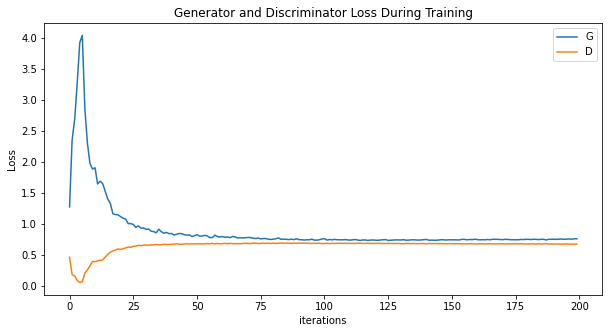

In [9]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(history_gen,label="G")
plt.plot(history_disc,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Generate fake image

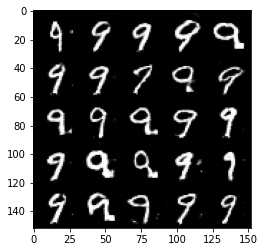

In [14]:
labels = torch.ones(batch_size, device=device, dtype=torch.int64) * 9
# generate fake image
random_noise = generate_noise_vector(batch_size, z_dim, device)

# include class into noise vector
random_noise = noise_vector_cond(random_noise, labels, n_classes)
#print(random_noise.shape)
fake_img = gen(random_noise)
show_tensor_images(fake_img)